#### Imports

NOTE: The SHAP package used in this code is slightly modified compared to the base SHAP package. Specifically, as the SHAP additivity check is known to occasionally fail for the TreeExplainer (https://github.com/shap/shap/issues/2778), and because the "check_additivity" flag does not always work, we manually disable the additivity check in SHAP (this can be done multiple ways, but we do it by increasing the additivity check threshold )

In [ ]:
import pickle
import json
from copy import deepcopy
from pathlib import Path
from natsort import natsorted
from itertools import chain,repeat
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import accuracy_score,confusion_matrix,ConfusionMatrixDisplay
import shap #NOTE See note above! This code requires some edits to the SHAP package code to run properly.


from metrics_gen import modelGroup

Note: when importing classes/functions from other python files, need window or environment refresh to bring in updated changes.

### Load Models

In [24]:
metrics_name_list = [
	['accuracy', metrics.accuracy_score],
	['precision', metrics.precision_score],
	['recall', metrics.recall_score],
	['f1', metrics.f1_score], 
	['jaccard', metrics.jaccard_score], 
	['roc_auc', metrics.roc_auc_score],
	]
pkl_dir = Path.cwd().parent/"data/pkls"
mod_nums = '2345'


fig_dir = Path.cwd().parent/"figures"
shap_fig_dir = fig_dir/"SHAP"

In [4]:
##~~~~~Load AtNR with No Polyethylene and Mordred Fix~~~~~##
#atnr_nope_dir = str(pkl_dir2D_atactic_NOPE_nr_fm\\"
atnr_nope_dir = str(pkl_dir/"2D_atactic_NOPE_nr_fm") + "\\"
atnr_nope_short_names = ['at_NOPE_nr_atom_bd', 'at_NOPE_nr_mordred', 
					   'at_NOPE_nr_mfp', 'at_NOPE_nr_rdfp', 'at_NOPE_nr_atom_mordred',
					   'at_NOPE_nr_atom_morganfp', 'at_NOPE_nr_atom_rdfp'] # BY DESIRED ORDER
atnr_nope_long_names = ['Atom and Bond (AtNR_NOPE_FM)', 
								 'Mordred (AtNR_NOPE_FM)', 
								 'Morgan FP (AtNR_NOPE_FM)', 
								 'RDKit FP (AtNR_NOPE_FM)',
								 'Atom + Mordred (AtNR_NOPE_FM)', 
								 'Atom + Morgan FP (AtNR_NOPE_FM)', 
								 'Atom + RDKit FP (AtNR_NOPE_FM)'] 

atnr_nope_mout = modelGroup(group_id='at_NOPE_nr', group_dir=atnr_nope_dir, model_num_str=mod_nums, 
							model_names_short=atnr_nope_short_names, descriptor_names_long=atnr_nope_long_names,
							 pca_used=False,
                			rand_seed_used=0)
atnr_nope_mout.load_model_data(hush=True)
atnr_nope_mout.set_y_data(f"{atnr_nope_dir + mod_nums}_atactic_NOPE_nr_y_train_data.pkl",
    					f"{atnr_nope_dir + mod_nums}_atactic_NOPE_nr_y_test_data.pkl")
atnr_nope_mout.gen_sklearn_metrics(metrics_list=metrics_name_list)
atnr_nope_mout.gen_dff(hush=False)
dff_atnr_nope = atnr_nope_mout.dff



Loading data for at_NOPE_nr...
    ...done
	Generating scikit-learn metrics (and confusion matrices)...
	...done
	Generating dataframe for at_NOPE_nr...
KFold acc 'averages': [0.7608354880413704, 0.7681318681318683, 0.7725544063779357, 0.7381006248653307, 0.7776745313510018, 0.7754794225382462, 0.7923346261581556, 0.8121579400991166, 0.8378339797457445, 0.7637712777418659, 0.7586322990734755, 0.8510396466278818, 0.8158155569920276, 0.7960191769015298, 0.7857492997198879, 0.7857304460245637, 0.7798992673992674, 0.7556722689075631, 0.7879390217625512, 0.7930833872010342, 0.7872091144149967, 0.6045976082740789, 0.7123761042878691, 0.50039592760181, 0.47028926955397543, 0.7094430079724198, 0.5260773540185305, 0.4791047188106011]
	Succesfully generated dataframe from model output for at_NOPE_nr
DESCRIP NAMES! ['at_NOPE_nr_atom_bd', 'at_NOPE_nr_atom_bd', 'at_NOPE_nr_atom_bd', 'at_NOPE_nr_atom_bd', 'at_NOPE_nr_mordred', 'at_NOPE_nr_mordred', 'at_NOPE_nr_mordred', 'at_NOPE_nr_mordred', 'at_NOP

In [8]:
dff_atnr_nope.sort_values(by='accuracy', ascending=False)

,model_label,descriptor_name,model_name,id,model_function,test_acc_average,kfold_acc_average,kfold_array,accuracy,precision,...,num_train,num_test,num_total,num_features_in,num_good_solv_train,num_bad_solv_train,num_good_solv_test,num_bad_solv_test,num_good_solv_total,num_bad_solv_total
2,at_NOPE_nr_atom_bd_RF,at_NOPE_nr_atom_bd,Random Forest,at_NOPE_nr,"(DecisionTreeClassifier(max_features='sqrt', r...",0.846154,0.823171,"[0.8241758241758241, 0.8754578754578755, 0.787...",0.846154,0.841791,...,1363,455,1818,49,937,426,299,156,1236,582
7,at_NOPE_nr_atom_mordred_RF,at_NOPE_nr_atom_mordred,Random Forest,at_NOPE_nr,"(DecisionTreeClassifier(max_features='sqrt', r...",0.839560,0.842970,"[0.8644688644688645, 0.8864468864468864, 0.809...",0.839560,0.834320,...,1363,455,1818,1601,937,426,299,156,1236,582
21,at_NOPE_nr_mordred_RF,at_NOPE_nr_mordred,Random Forest,at_NOPE_nr,"(DecisionTreeClassifier(max_features='sqrt', r...",0.830769,0.850310,"[0.8681318681318682, 0.8901098901098901, 0.820...",0.830769,0.830357,...,1363,455,1818,1611,937,426,299,156,1236,582
11,at_NOPE_nr_atom_morganfp_RF,at_NOPE_nr_atom_morganfp,Random Forest,at_NOPE_nr,"(DecisionTreeClassifier(max_features='sqrt', r...",0.824176,0.818032,"[0.8388278388278388, 0.8534798534798534, 0.783...",0.824176,0.815562,...,1363,455,1818,65585,937,426,299,156,1236,582
15,at_NOPE_nr_atom_rdfp_AB,at_NOPE_nr_atom_rdfp,AdaBoost,at_NOPE_nr,"(DecisionTreeClassifier(max_depth=1, random_st...",0.808791,0.784992,"[0.8095238095238095, 0.8058608058608059, 0.794...",0.808791,0.823171,...,1363,455,1818,65585,937,426,299,156,1236,582
14,at_NOPE_nr_atom_rdfp_RF,at_NOPE_nr_atom_rdfp,Random Forest,at_NOPE_nr,"(DecisionTreeClassifier(max_features='sqrt', r...",0.793407,0.808487,"[0.8498168498168498, 0.8241758241758241, 0.783...",0.793407,0.805970,...,1363,455,1818,65585,937,426,299,156,1236,582
23,at_NOPE_nr_mordred_DT,at_NOPE_nr_mordred,Decision Tree,at_NOPE_nr,DecisionTreeClassifier(),0.786813,0.774012,"[0.7802197802197802, 0.8095238095238095, 0.754...",0.786813,0.830065,...,1363,455,1818,1611,937,426,299,156,1236,582
0,at_NOPE_nr_atom_bd_DT,at_NOPE_nr_atom_bd,Decision Tree,at_NOPE_nr,DecisionTreeClassifier(),0.778022,0.755686,"[0.7472527472527473, 0.7802197802197802, 0.739...",0.778022,0.817308,...,1363,455,1818,49,937,426,299,156,1236,582
5,at_NOPE_nr_atom_mordred_DT,at_NOPE_nr_atom_mordred,Decision Tree,at_NOPE_nr,DecisionTreeClassifier(),0.778022,0.778431,"[0.7802197802197802, 0.8021978021978022, 0.750...",0.778022,0.823529,...,1363,455,1818,1601,937,426,299,156,1236,582
13,at_NOPE_nr_atom_rdfp_DT,at_NOPE_nr_atom_rdfp,Decision Tree,at_NOPE_nr,DecisionTreeClassifier(),0.771429,0.790861,"[0.7948717948717948, 0.8498168498168498, 0.783...",0.771429,0.798165,...,1363,455,1818,65585,937,426,299,156,1236,582


In [3]:

##~~~~~Load CoDi~~~~~##
codi_dir = str(pkl_dir/"2D_copoly") + "\\"
mod_nums_codi = "4"

codi_short_names = ['co_di_atom_bd', 'co_di_mordred', 
					   'co_di_mfp', 'co_di_rdfp', 'co_di_atom_mordred',
					   'co_di_atom_morganfp', 'co_di_atom_rdfp'] # BY DESIRED ORDER
codi_long_names = ['Atom and Bond (CoDi)', 
								 'Mordred (CoDi)', 
								 'Morgan FP (CoDi)', 
								 'RDKit FP (CoDi)',
								 'Atom + Mordred (CoDi) ', 
								 'Atom + Morgan FP (CoDi)', 
								 'Atom + RDKit FP (CoDi)'] 
codi_mout = modelGroup(group_id='co_di', group_dir=codi_dir, 
                       		model_num_str=mod_nums_codi, 
							model_names_short=codi_short_names, descriptor_names_long=codi_long_names,
							 pca_used=False,
        					rand_seed_used=0)
codi_mout.load_model_data(hush=False)
codi_mout.set_y_data(f"{codi_dir + mod_nums_codi}_copoly_y_train_data.pkl",
    					f"{codi_dir + mod_nums_codi}_copoly_y_test_data.pkl")
codi_mout.gen_sklearn_metrics(metrics_list=metrics_name_list)
codi_mout.gen_dff(hush=True)
dff_codi = codi_mout.dff



Loading data for co_di...
	Loading the 0th model...
		co_di_atom_bd model data loaded sucessfully
		co_di_atom_bd kfold data loaded sucessfully
		co_di_atom_bd X train loaded sucessfully
		co_di_atom_bd X test data loaded sucessfully
	Loading the 1th model...
		co_di_mordred model data loaded sucessfully
		co_di_mordred kfold data loaded sucessfully
		co_di_mordred X train loaded sucessfully
		co_di_mordred X test data loaded sucessfully
	Loading the 2th model...
		co_di_mfp model data loaded sucessfully
		co_di_mfp kfold data loaded sucessfully
		co_di_mfp X train loaded sucessfully
		co_di_mfp X test data loaded sucessfully
	Loading the 3th model...
		co_di_rdfp model data loaded sucessfully
		co_di_rdfp kfold data loaded sucessfully
		co_di_rdfp X train loaded sucessfully
		co_di_rdfp X test data loaded sucessfully
	Loading the 4th model...


		co_di_atom_mordred model data loaded sucessfully
		co_di_atom_mordred kfold data loaded sucessfully
		co_di_atom_mordred X train loaded sucessfully
		co_di_atom_mordred X test data loaded sucessfully
	Loading the 5th model...
		co_di_atom_morganfp model data loaded sucessfully
		co_di_atom_morganfp kfold data loaded sucessfully
		co_di_atom_morganfp X train loaded sucessfully
		co_di_atom_morganfp X test data loaded sucessfully
	Loading the 6th model...
		co_di_atom_rdfp model data loaded sucessfully
		co_di_atom_rdfp kfold data loaded sucessfully
		co_di_atom_rdfp X train loaded sucessfully
		co_di_atom_rdfp X test data loaded sucessfully
	Succesfully loaded all model data.

	Generating dataframe for co_di...
		Succesfully generated dataframe from model output for co_di
    ...done
	Generating scikit-learn metrics (and confusion matrices)...
	...done
DESCRIP NAMES! ['co_di_atom_bd', 'co_di_mordred', 'co_di_mfp', 'co_di_rdfp', 'co_di_atom_mordred', 'co_di_atom_morganfp', 'co_di_atom_

In [ ]:
dff_codi.sort_values(by='accuracy', ascending=False)

In [22]:
rdk_all_X = pd.concat([atnr_nope_mout.all_X_train[0][1], atnr_nope_mout.all_X_test[0][1]])
corr_all_X_rdk_atnr_nope = rdk_all_X.corr()
# Return only monomer-monomer correlation
corr_all_X_rdk_atnr_nope = corr_all_X_rdk_atnr_nope - np.diagflat([1]*corr_all_X_rdk_atnr_nope.shape[0])
corr_all_X_rdk_atnr_nope_mono = corr_all_X_rdk_atnr_nope.iloc[0:25,0:25]
corr_all_X_rdk_atnr_nope_solvent = corr_all_X_rdk_atnr_nope.iloc[25:,25:]
# Return only solvent-solvent correlation
for col in corr_all_X_rdk_atnr_nope.columns:
	print('\n',col)
	max_val = corr_all_X_rdk_atnr_nope[col].max()
	if max_val > 0.99:
		print("\t--->WARNING: CORRELATION IS 1.0<---")
	elif max_val > 0.8:
		print("\t--->High Corr (>0.8)")
	elif max_val < 0.5:
		print("\t--->Low Corr (<0.5)")
	max_ind = list(corr_all_X_rdk_atnr_nope[corr_all_X_rdk_atnr_nope[col] == max_val].index)
	if len(max_ind) > 1:
		print("WARNING: TWO MAX VALUES FOUND!",max_ind)
		continue
	else:
		max_ind = max_ind[0]
	print(f"\tMAX {col}:\n\t{max_ind, np.round(max_val, 2)}")

	high_corr_vals = corr_all_X_rdk_atnr_nope[col].nlargest(3)
	print("\tTOP 3 CORRELATIONS:",list(high_corr_vals.index))


 lipinskiHBA_mono
	--->High Corr (>0.8)
	MAX lipinskiHBA_mono:
	('tpsa_mono', 0.96)
	TOP 3 CORRELATIONS: ['tpsa_mono', 'NumHBA_mono', 'NumHeteroatoms_mono']

 NumHBA_mono
	--->High Corr (>0.8)
	MAX NumHBA_mono:
	('lipinskiHBA_mono', 0.91)
	TOP 3 CORRELATIONS: ['lipinskiHBA_mono', 'tpsa_mono', 'NumHeteroatoms_mono']

 lipinskiHBD_mono
	--->High Corr (>0.8)
	MAX lipinskiHBD_mono:
	('NumHBD_mono', 0.91)
	TOP 3 CORRELATIONS: ['NumHBD_mono', 'tpsa_mono', 'NumAmideBonds_mono']

 NumHBD_mono
	--->High Corr (>0.8)
	MAX NumHBD_mono:
	('lipinskiHBD_mono', 0.91)
	TOP 3 CORRELATIONS: ['lipinskiHBD_mono', 'tpsa_mono', 'NumAmideBonds_mono']

 NumRotatableBonds_mono
	--->High Corr (>0.8)
	MAX NumRotatableBonds_mono:
	('kappa2_mono', 0.95)
	TOP 3 CORRELATIONS: ['kappa2_mono', 'kappa1_mono', 'chi0v_mono']

 NumHeteroatoms_mono
	--->High Corr (>0.8)
	MAX NumHeteroatoms_mono:
	('lipinskiHBA_mono', 0.81)
	TOP 3 CORRELATIONS: ['lipinskiHBA_mono', 'NumHBA_mono', 'tpsa_mono']

 NumAmideBonds_mono
	MAX NumAm

In [23]:
corr_all_X_rdk_atnr_nope.shape,corr_all_X_rdk_atnr_nope_mono.shape,corr_all_X_rdk_atnr_nope_solvent.shape

((49, 49), (25, 25), (24, 24))

In [74]:
utriang_mask = pd.DataFrame(np.tril(corr_all_X_rdk_atnr_nope.abs()), 
							columns=corr_all_X_rdk_atnr_nope.columns,
							index=corr_all_X_rdk_atnr_nope.index)
utriang_mask

,lipinskiHBA_mono,NumHBA_mono,lipinskiHBD_mono,NumHBD_mono,NumRotatableBonds_mono,NumHeteroatoms_mono,NumAmideBonds_mono,FractionCSP3_mono,NumRings_mono,NumAromaticRings_mono,...,NumAliphaticHeterocyclessolvent,tpsasolvent,chi0vsolvent,chi1vsolvent,chi2vsolvent,chi3vsolvent,chi4vsolvent,kappa1solvent,kappa2solvent,kappa3solvent
lipinskiHBA_mono,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumHBA_mono,0.912366,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
lipinskiHBD_mono,0.534320,0.299596,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumHBD_mono,0.530850,0.337206,0.913211,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumRotatableBonds_mono,0.437185,0.472438,0.264235,0.259124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumHeteroatoms_mono,0.808442,0.783957,0.405831,0.437405,0.420190,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumAmideBonds_mono,0.393589,0.140713,0.633376,0.574008,0.144652,0.318944,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
FractionCSP3_mono,0.148881,0.125558,0.118535,0.098503,0.340455,0.095012,0.086466,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumRings_mono,0.230562,0.248605,0.066437,0.096002,0.039950,0.199245,0.084877,0.280807,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumAromaticRings_mono,0.225185,0.223125,0.091518,0.121020,0.133793,0.210307,0.066641,0.446334,0.841177,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


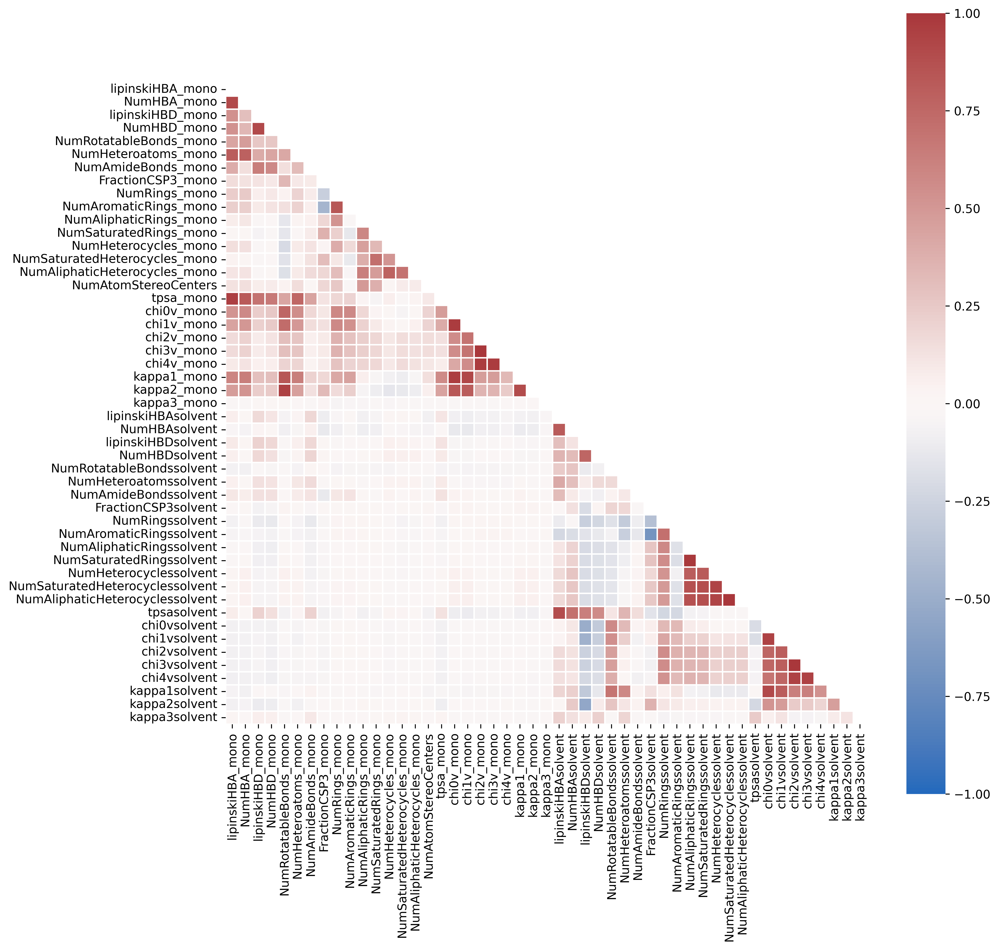

In [105]:
fig, ax = plt.subplots(figsize=(12,12), dpi=600, ncols=1, nrows=1)
# import file with data
data = rdk_all_X
 
# applying mask
mask = np.triu(np.ones_like(data.corr()))
 
# plotting a triangle correlation heatmap
dataplot = sns.heatmap(data.corr(), mask=mask, cmap="vlag", ax=ax, linewidths=1,
					   square=True, vmin=-1.0, vmax=1.0, cbar_kws={"vmin":-1.0, "vmax":1.0, }
					   )
fig.savefig(fig_dir/"corr_all_atnr_NOPE_RAW.svg", format="svg", dpi=600)

## Model Analysis and Plotting

In [14]:
def _plot_cm_grid(cm_list, model_names_list, numrows: int=2, numcols: int=3, #model_names_list_list
				figsize_tuple: tuple=(12,6), c_map: str='viridis', fig_title: str=None,
				v_min: int=0, v_max: int=260, h_pad_param: int=2, force_v_min_max: tuple=(False,False),
				shrink_amt: float=0.85, sort_by_acc: bool=True,
				save_img_path: str=None, save_fmt: str='png', hush: bool=True):
	""" 
	From a confusion matrix list (cm_list) and a model names list (model_nameslist), output a grid plot of confusion matrices.
	Optional parameters: numrows, num cols, fig size (tuple), color map, fig title, vmin, and vmax.
	Note that vmin and vmax will be overwritten if the dataset has a smaller or larger vmin when force_v_min_max is not set to True (default)
	"""

	fig, axs = plt.subplots(nrows=numrows, ncols=numcols, figsize=figsize_tuple)
	fig.tight_layout(h_pad=h_pad_param) # increase vertical spacing between rows
	plt.subplots_adjust(wspace=0.05, hspace=0.25)
	row_num = 0
	col_num = 0
	
	cm_arrs = cm_list

	min_val = np.min([x for x in cm_arrs])
	max_val = np.max([x for x in cm_arrs])
	print(f"\tMin: {min_val}  Max: {max_val}")
	
	# Only works if v_min and v_max are bigger than expected.
	if force_v_min_max[0] == False:
		v_min_true = min(v_min, min_val)
	else:
		v_min_true = v_min
	if force_v_min_max[1] == False:
		v_max_true = max(v_max, max_val)
	else:
		v_max_true = v_max


	if sort_by_acc == True:

		def model_acc_zip(cm_ind_arr):
			cm_ind,cm_arr = cm_ind_arr
			if not hush:
				print("CM IND",cm_ind,"\tCM ARR",cm_arr)
				print("CM IND ARRAY",cm_ind_arr)
			(tn,fp),(fn,tp) = cm_arr
			acc = ((tn+tp)/np.sum(cm_arr))
			#print("ACC",acc)
			return acc
		
		cm_inds = [i for i in range(len(cm_arrs))]
		if not hush:
			print("BEFORE SORT INDS",cm_inds)
		cm_inds, cm_arrs = zip(*sorted(zip(cm_inds, cm_arrs), key=model_acc_zip))
		cm_inds, cm_arrs = [list(t) for t in [cm_inds,cm_arrs]]


		if not hush:
			print("\nAFTER SORT INDS",cm_inds)


		model_names_sorted = [model_names_list[ind] for ind in cm_inds]
		if not hush:
			print("OLD MODEL NAMES",model_names_list)
			print("NEW MODEL NAMES",model_names_sorted)


	for i,curr_cm in enumerate(cm_arrs):
		axs_number_cols = axs.shape[1]
		col_num = i % axs_number_cols
		if i > 0 and col_num == 0:
			row_num += 1


		model_name = model_names_list[i] 
		if sort_by_acc == True:
			model_name = model_names_sorted[i] ?
		curr_ax = axs[row_num][col_num]
		curr_ax.set_title(model_name, weight='bold', fontsize=14)
		curr_ax.set_xlabel('Predicted')
		curr_ax.set_ylabel('True')
		#* Set Vmin/VMax to anchor colorbar
		res = sns.heatmap(curr_cm, vmin=v_min_true, vmax=v_max_true, cmap=c_map, annot=True, fmt='g', 
						linewidths=0.5,
		             xticklabels=['bad_predicted','good_predicted'],yticklabels=['bad_true','good_true'],
		             ax=curr_ax, square=True, cbar_kws={"shrink": shrink_amt},annot_kws={
           																			     'fontsize': 16,
           																			     'fontweight': 'bold',
           																			 })
		res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 12)
		res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 12)
	if fig_title is not None:
		fig.suptitle(fig_title, fontsize=16, weight='bold', y=1.05)
	if save_img_path is not None:
		plt.savefig(save_img_path + "_CM_grid.png", format=save_fmt, dpi=1000)
		#save_name = save_dir + name

	print("\tDone.")
	return axs





def plot_cm_grids_obj(group_obj=None, save_dir: str=None, save_format: str='png',
						hush: bool=True):
	"""
	Receives a modelGroup object and plots all corresponding grids of confusion matrices.
	Saves to file if save_dir is given. Files saved as '{model_name}_{descriptor}_CM_grid.png', 
	typically at DPI 1000 (subject to change).
	Returns a list of axes which are sorted based on model accuracy
	"""
	print(f"Plotting CM Grids for {group_obj.group_id}...")
	archi_names_lst = ['Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']
	all_cm_axs = []
	descriptor_names, model_lists = zip(*group_obj.all_cms)
	hush_status = hush
	for i,archi_list in enumerate(model_lists):
		if type(archi_list) == list and len(archi_list) > 0 :
			archi_name, archi_cm, archi_disp = zip(*archi_list)
		descrip_name = group_obj.descriptor_names_long[i]
		if not hush:
			print(f"Archi name:{archi_name}\n\tArchi_cm:{archi_cm}")
		if save_dir is not None:
			save_path = save_dir + group_obj.group_id + f'_{i}_' + group_obj.model_names_short[i]
			print(f"Saving to ...{save_path[-20:]}...")

		comp_cm_axs = _plot_cm_grid(archi_cm, archi_names_lst, numrows=2, numcols=2,
									figsize_tuple=(10,8),
									 h_pad_param=1.0, 
									fig_title=descrip_name, shrink_amt=1,
									v_min=0, v_max=260,
									save_img_path=save_path, save_fmt=save_format, hush=hush_status)
		all_cm_axs.append(comp_cm_axs)
	
	return all_cm_axs


### CM Grid

In [102]:
codi_df = pd.read_pickle(Path.cwd().parent/"data/pkls/df_dicopoly_norad.pkl")
codi_df.polymer.nunique()

100

Plotting CM Grids for at_NOPE_nr...
Saving to ...0_at_NOPE_nr_atom_bd...
	Min: 17  Max: 282
	Done.
Saving to ...1_at_NOPE_nr_mordred...
	Min: 20  Max: 279
	Done.
Saving to ..._nr_2_at_NOPE_nr_mfp...
	Min: 29  Max: 265
	Done.
Saving to ...nr_3_at_NOPE_nr_rdfp...
	Min: 24  Max: 272
	Done.
Saving to ...NOPE_nr_atom_mordred...
	Min: 17  Max: 282
	Done.
Saving to ...OPE_nr_atom_morganfp...
	Min: 16  Max: 283
	Done.
Saving to ...at_NOPE_nr_atom_rdfp...
	Min: 29  Max: 270
	Done.
Plotting CM Grids for solv_shape...
Saving to ...0_solv_shape_atom_bd...
	Min: 16  Max: 283
	Done.
Saving to ...1_solv_shape_mordred...
	Min: 23  Max: 276
	Done.
Saving to ...ape_2_solv_shape_mfp...
	Min: 29  Max: 265
	Done.
Saving to ...pe_3_solv_shape_rdfp...
	Min: 24  Max: 272
	Done.
Saving to ...v_shape_atom_mordred...
	Min: 19  Max: 280
	Done.
Saving to ..._shape_atom_morganfp...
	Min: 23  Max: 276
	Done.
Saving to ...solv_shape_atom_rdfp...
	Min: 30  Max: 269
	Done.
Plotting CM Grids for co_di...
Saving to ...o_

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


	Done.


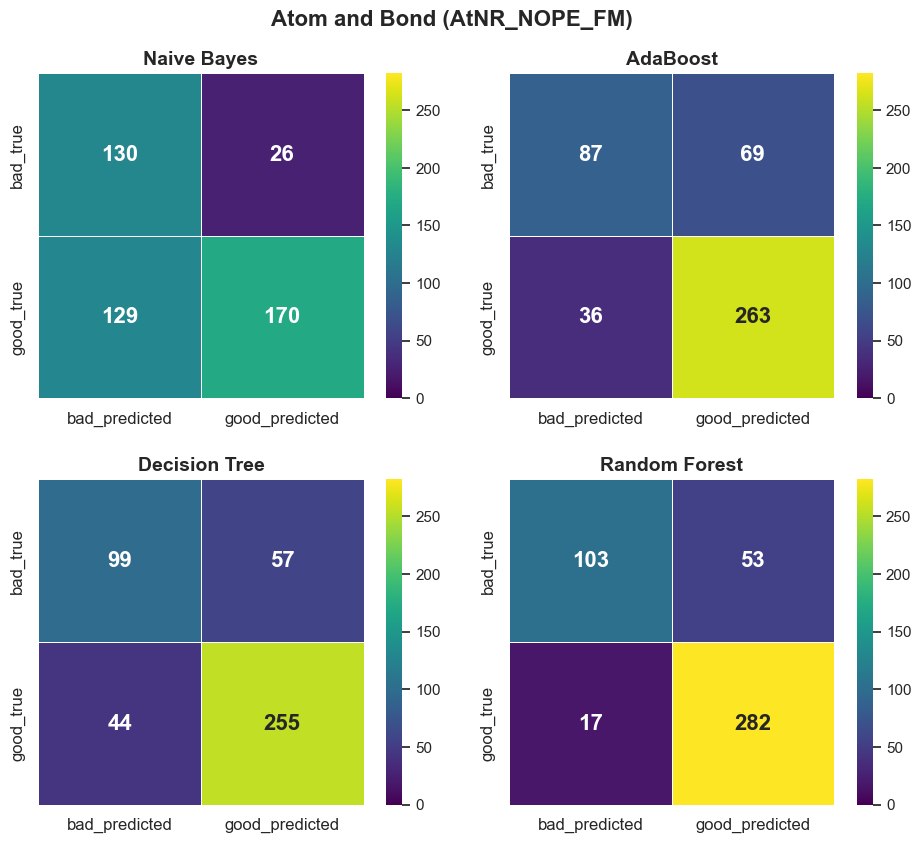

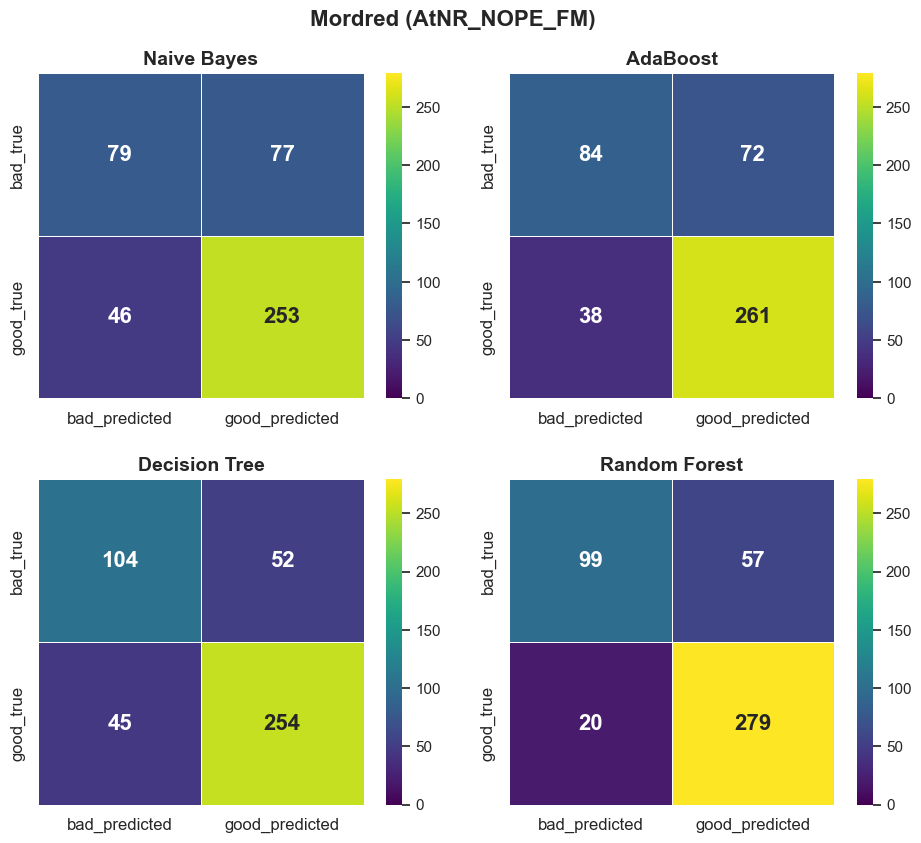

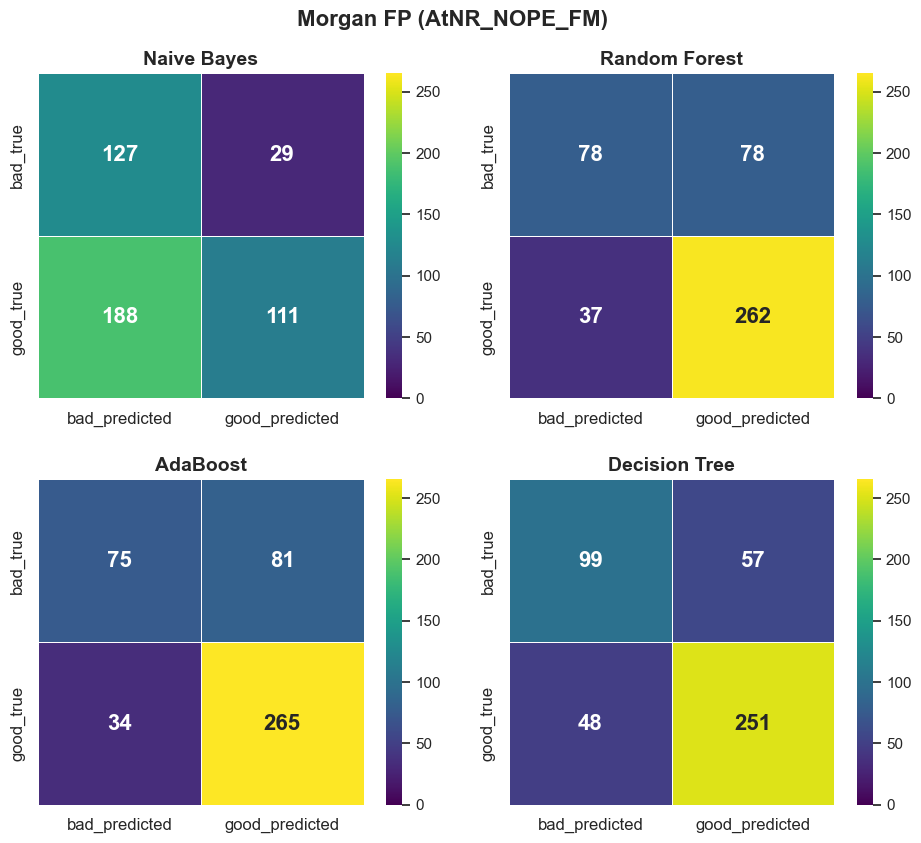

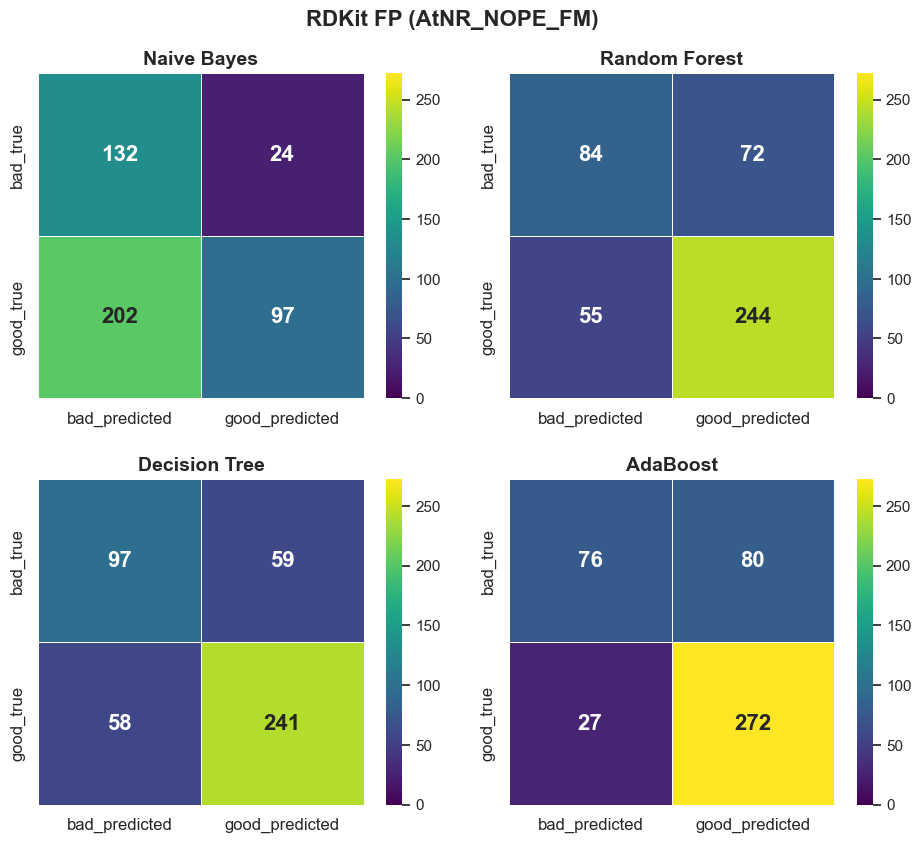

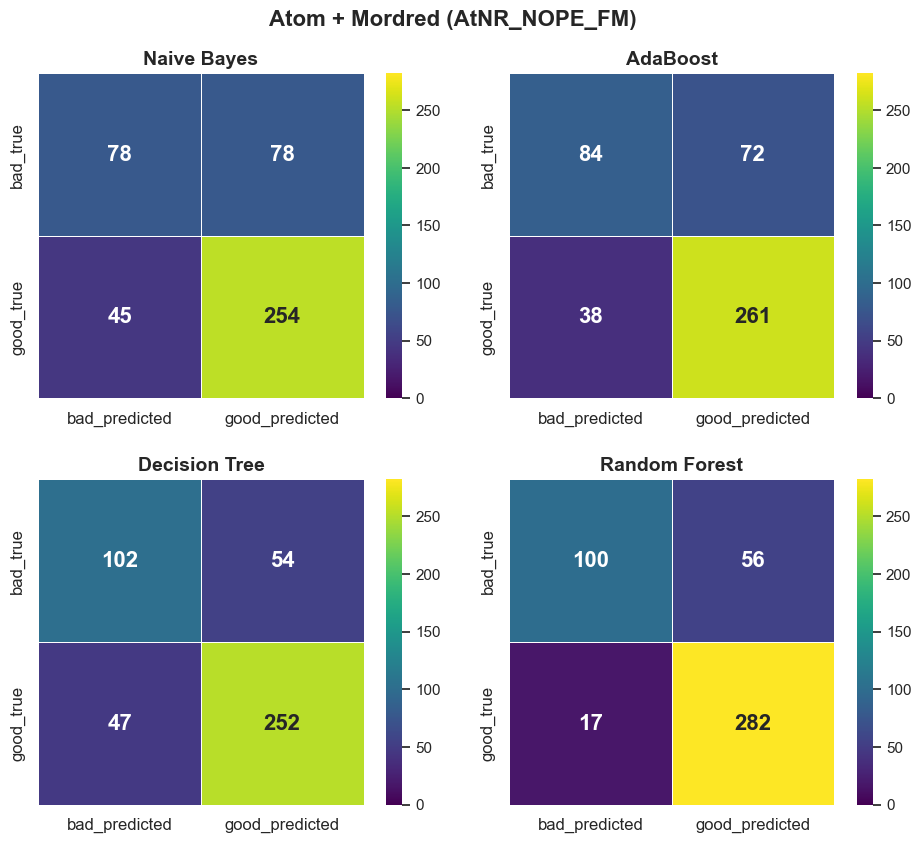

...

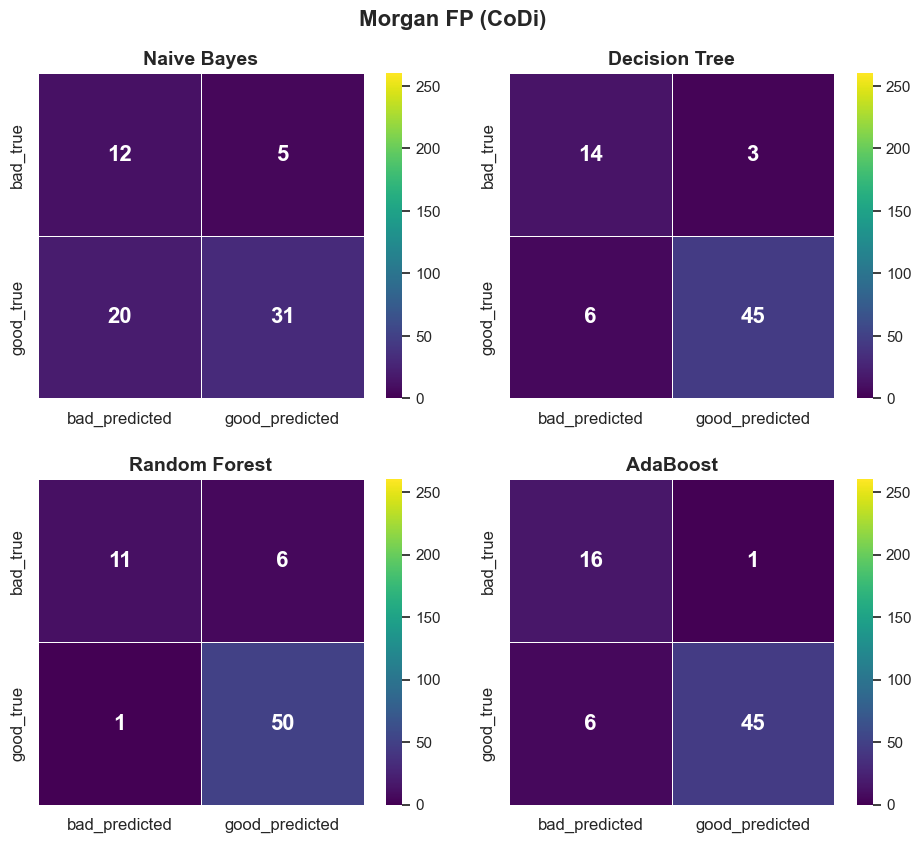

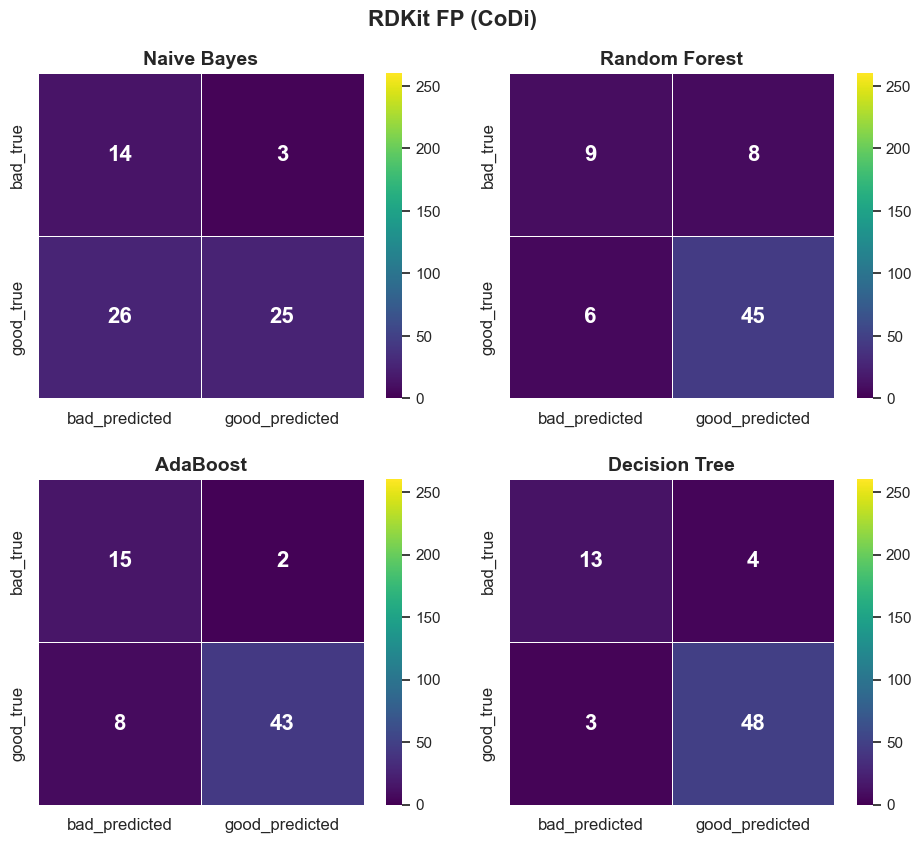

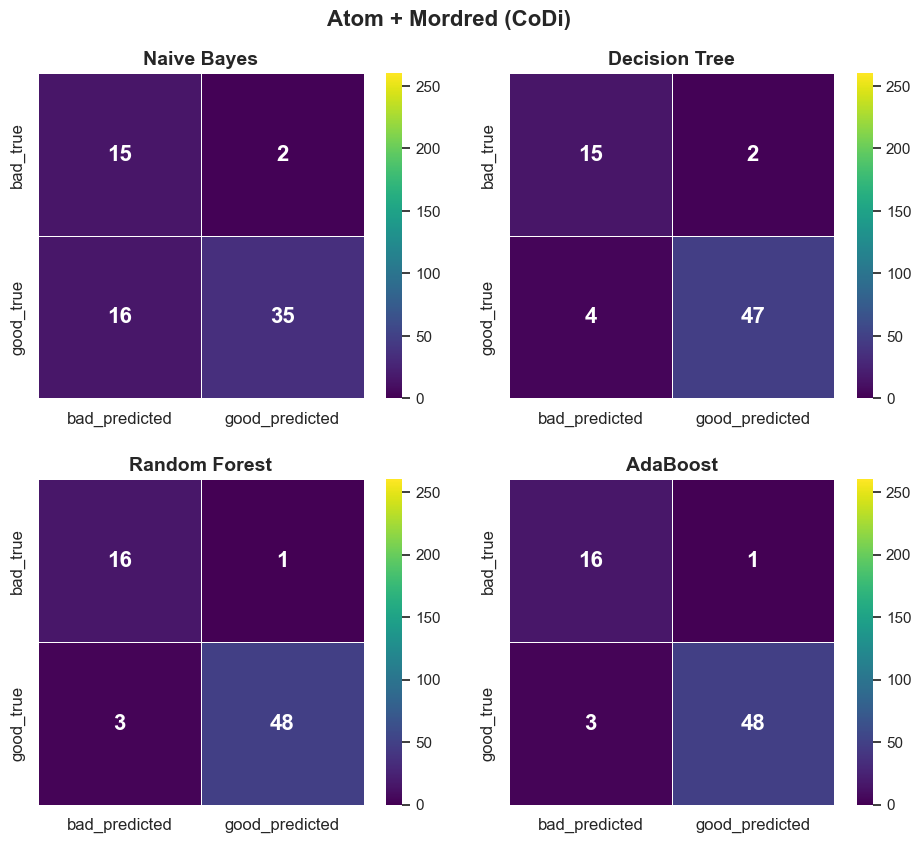

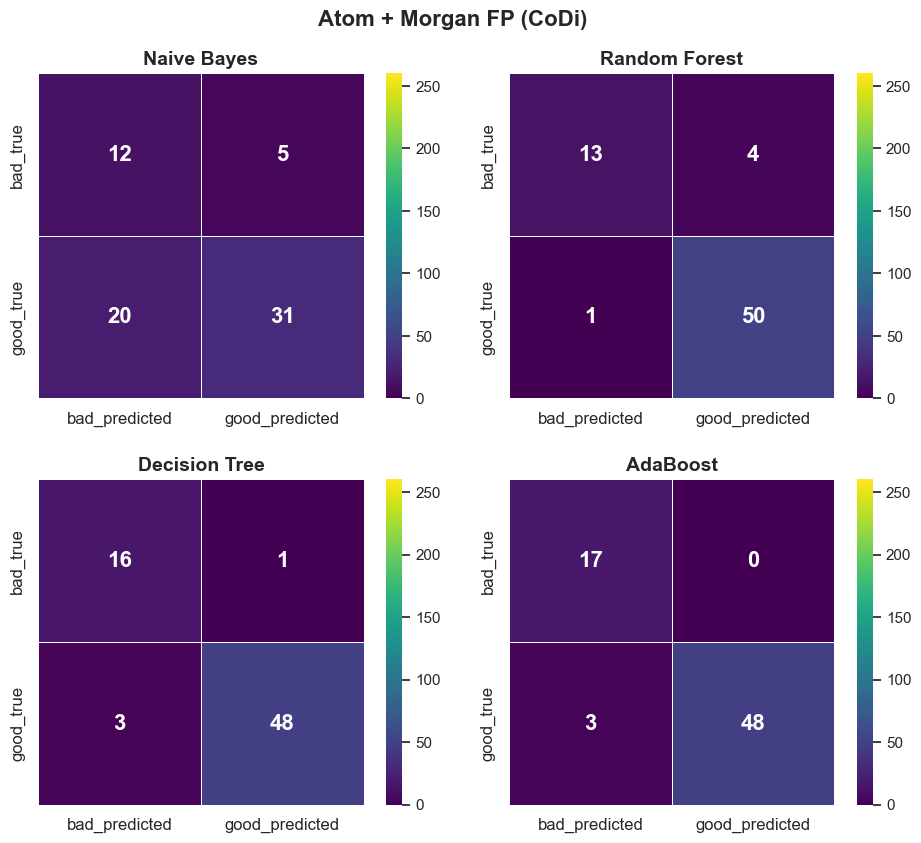

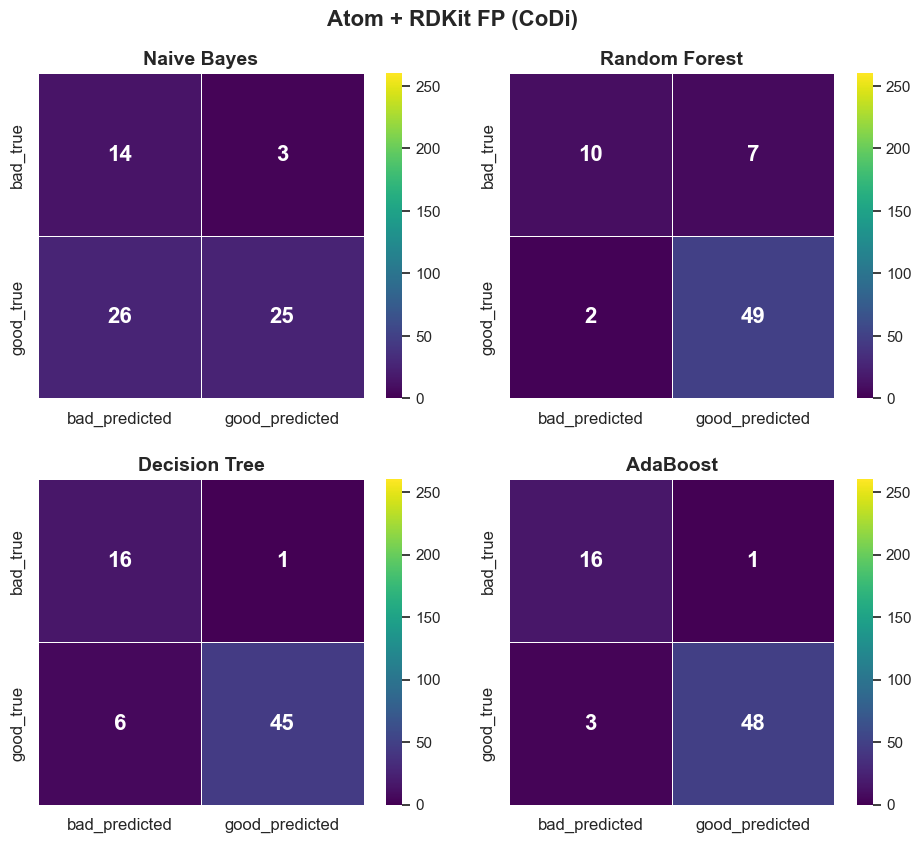

In [106]:
save_dirr = fig_dir
atnr_nope_cm_grids = plot_cm_grids_obj(atnr_nope_mout, save_dir=save_dirr)
codi_cm_grids = plot_cm_grids_obj(codi_mout, save_dir=save_dirr)

Plotting CM Grids for homo_pca...
Saving to ...\\homo_pca_0_atom_bd...
	Min: 20  Max: 238
	Done.
Saving to ...\\homo_pca_1_mordred...
	Min: 21  Max: 237
	Done.
Saving to ...ures\\homo_pca_2_mfp...
	Min: 4  Max: 254
	Done.
Saving to ...res\\homo_pca_3_rdfp...
	Min: 9  Max: 249
	Done.
Saving to ...o_pca_4_atom_mordred...
	Min: 20  Max: 238
	Done.
Saving to ..._pca_5_atom_morganfp...
	Min: 8  Max: 250
	Done.
Saving to ...homo_pca_6_atom_rdfp...
	Min: 10  Max: 248
	Done.
Plotting CM Grids for homo_nopca...
Saving to ...homo_nopca_0_atom_bd...
	Min: 19  Max: 239
	Done.
Saving to ...homo_nopca_1_mordred...
	Min: 15  Max: 243
	Done.
Saving to ...es\\homo_nopca_2_mfp...
	Min: 25  Max: 233
	Done.
Saving to ...s\\homo_nopca_3_rdfp...
	Min: 26  Max: 232
	Done.
Saving to ...nopca_4_atom_mordred...
	Min: 15  Max: 243
	Done.
Saving to ...opca_5_atom_morganfp...
	Min: 13  Max: 245
	Done.
Saving to ...mo_nopca_6_atom_rdfp...
	Min: 13  Max: 245
	Done.
Plotting CM Grids for homo_3d...
Saving to ...homo_

C:\Users\Chris\AppData\Local\Temp\ipykernel_13100\2626363557.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=numrows, ncols=numcols, figsize=figsize_tuple)


	Done.
Saving to ...\\homo_dft_3d_3_rdfp...
	Min: 20  Max: 230
	Done.
Saving to ...ft_3d_4_atom_mordred...
	Min: 17  Max: 233
	Done.
Saving to ...o_dft_3d_5_atom_rdfp...
	Min: 20  Max: 230
	Done.
Saving to ...t_3d_6_atom_morganfp...
	Min: 14  Max: 236
	Done.
Saving to ...dft_3d_7_dft_atom_bd...
	Min: 19  Max: 231
	Done.
Saving to ...d_8_dft_atom_mordred...
	Min: 17  Max: 233
	Done.
Saving to ...t_3d_9_dft_atom_rdfp...
	Min: 17  Max: 233
	Done.
Saving to ...10_dft_atom_morganfp...
	Min: 15  Max: 235
	Done.
Saving to ...dft_3d_11_atom_bd_3d...
	Min: 21  Max: 229
	Done.
Saving to ...d_12_atom_mordred_3d...
	Min: 17  Max: 233
	Done.
Saving to ..._13_atom_morganfp_3d...
	Min: 16  Max: 234
	Done.
Saving to ...t_3d_14_atom_rdfp_3d...
	Min: 14  Max: 234
	Done.
Saving to ...3d_15_dft_atom_bd_3d...
	Min: 19  Max: 231
	Done.
Saving to ..._dft_atom_mordred_3d...
	Min: 16  Max: 234
	Done.
Saving to ...dft_atom_morganfp_3d...
	Min: 17  Max: 233
	Done.
Saving to ..._18_dft_atom_rdfp_3d...
	Min: 14  M

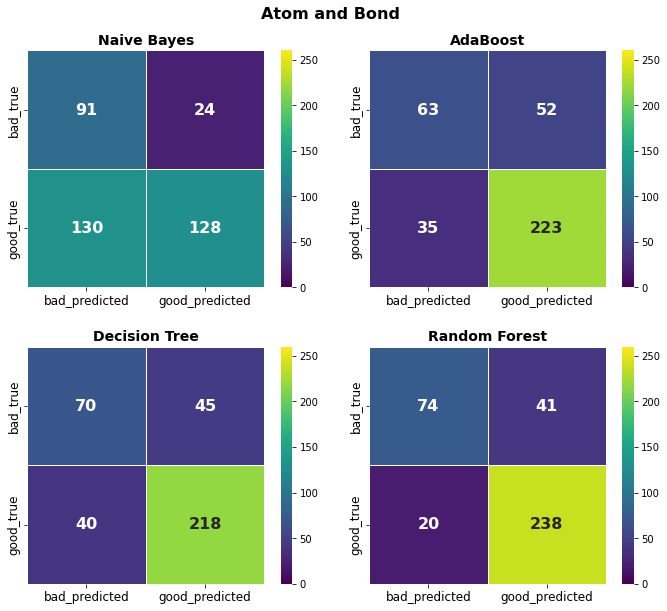

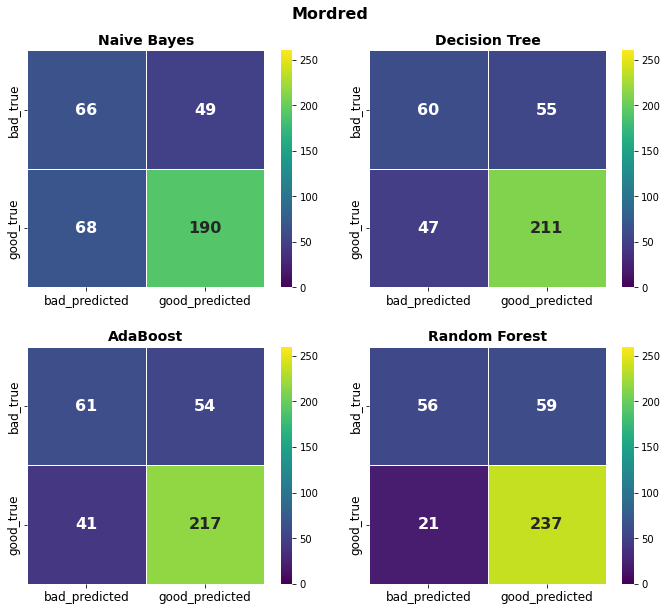

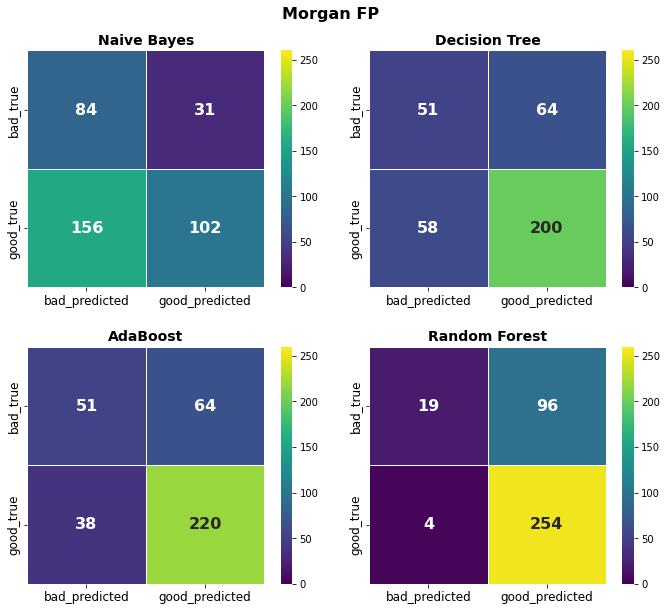

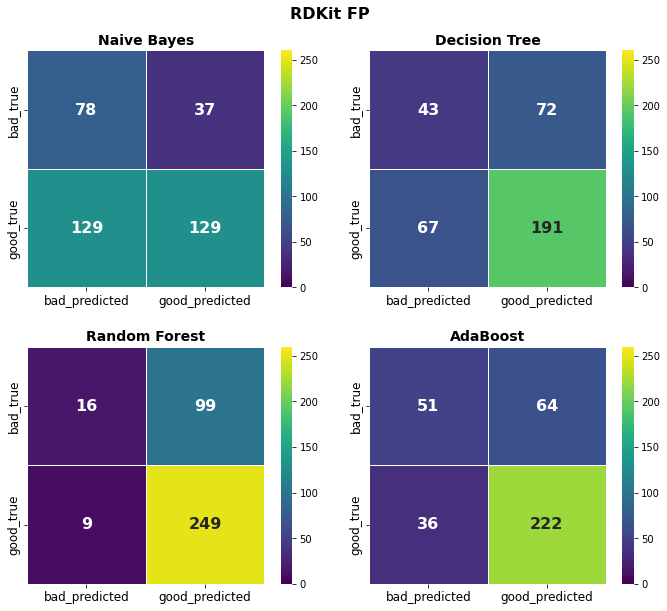

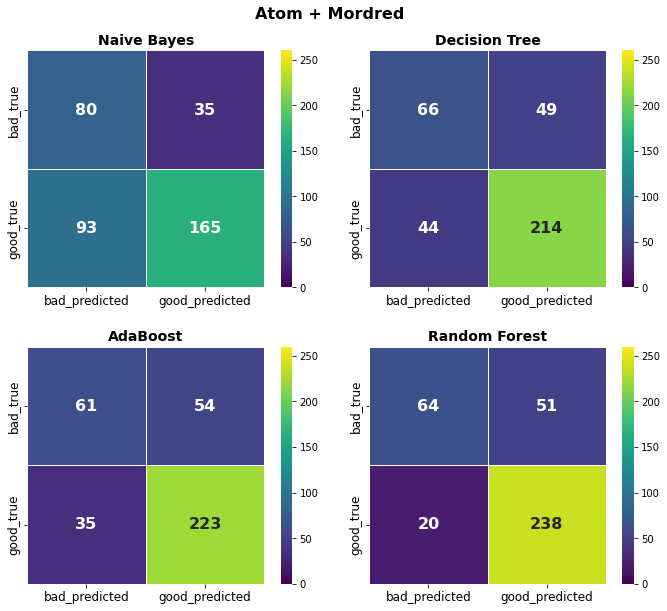

...

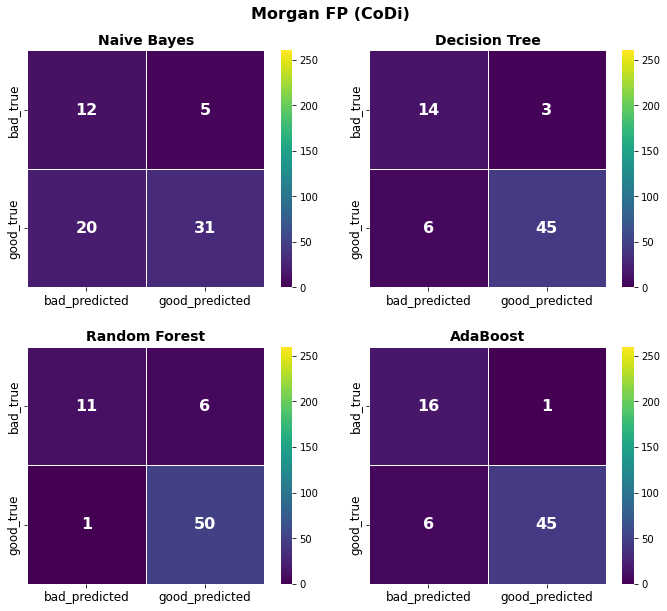

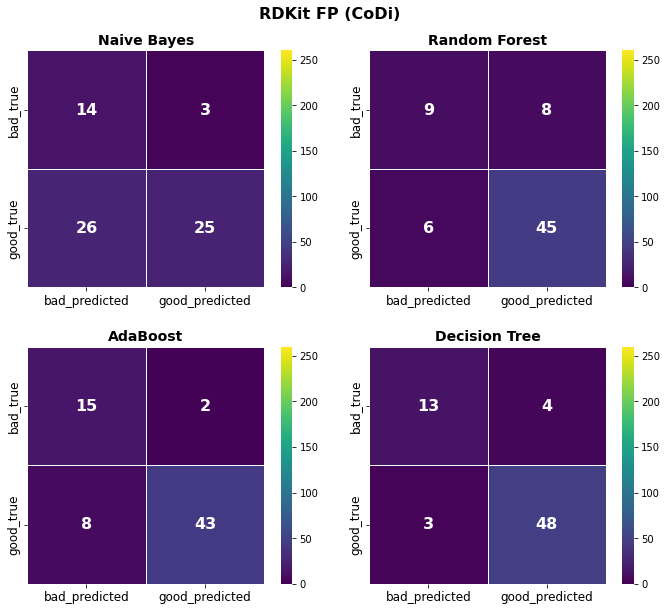

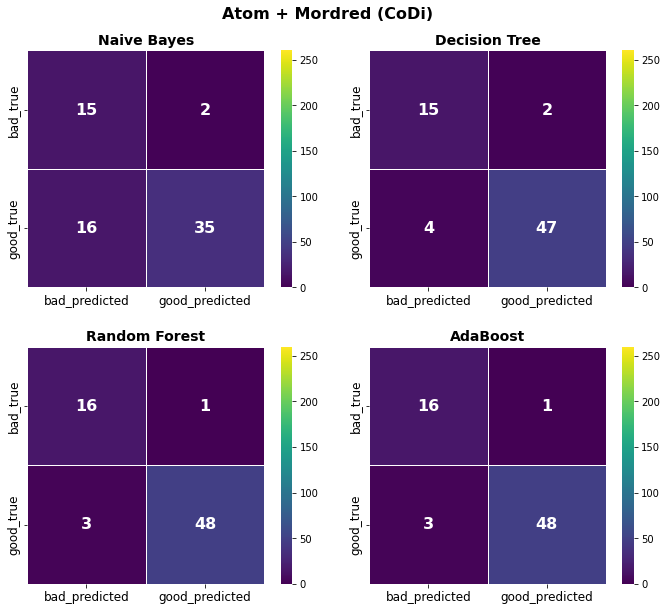

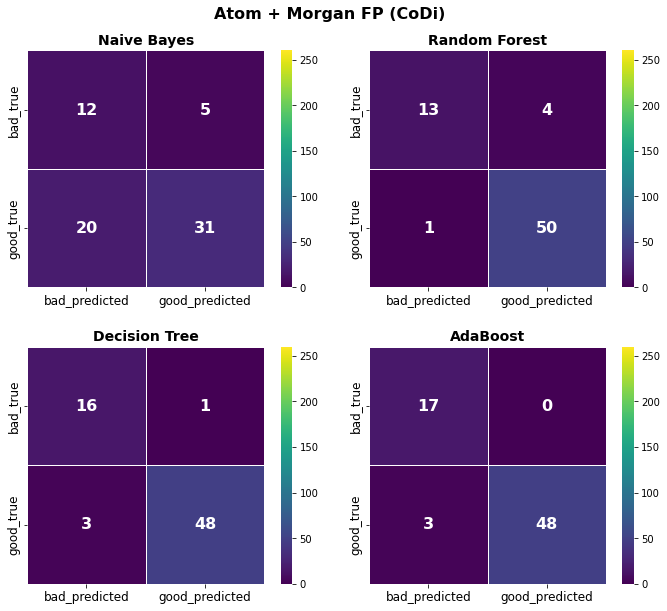

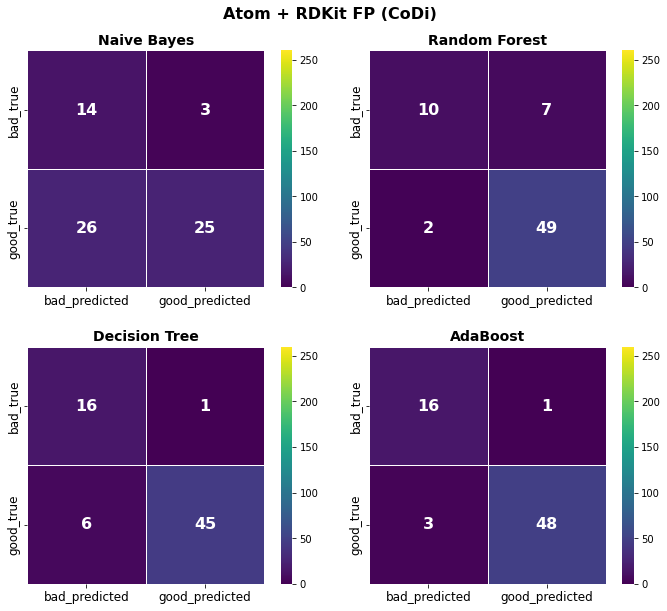

In [ ]:
save_dir = Path.cwd()/"Generated_model_figures"
if not save_dir.exists():
    save_dir.mkdir()

at_nr_cm_grids = plot_cm_grids_obj(atnr_nope_mout, save_dir=save_dir)
codi_cm_grids = plot_cm_grids_obj(codi_mout, save_dir=save_dir)

### Metrics Heatmap

In [16]:


def _create_metrics_heatmap(g_obj=None, df_metrics=None, figsize_tuple: tuple=(6,6), 
							c_map='flare', fig_title = None, 
							v_min: int=0.28, v_max: int=1, shrink_amt: float=0.55, sort_by_acc: bool=True,
							save_img_path: str=None, save_fmt: str='png', hush: bool=True):
	fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize_tuple, dpi=1000) # Think about DPI.


	if sort_by_acc == True:
		df_metrics = df_metrics.sort_values(by='accuracy')
	ax = sns.heatmap(df_metrics, cmap=c_map, annot=True, linewidths=0.5, square=True, vmin=v_min, vmax=v_max, cbar_kws={"shrink": shrink_amt},
						annot_kws={'fontsize': 14, 'fontweight': 'bold'})
	ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize = 12, rotation=0)
	ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 12, rotation=0, weight='bold')
	ax.set_ylabel('')
	if fig_title is not None:
		ax.set_title(fig_title, weight='bold', fontsize=14)
	if save_img_path is not None:
		plt.savefig(save_img_path/(f"_metrics_HM.{save_fmt}", format=save_fmt, dpi=1000))
	return ax

def plot_metrics_heatmap(group_obj=None, save_dir: str=None, save_format: str='png',
						hush: bool=True):
	"""
	Receives a modelGroup object and plots all corresponding metrics heatmaps.
	Saves to file if save_dir is given. Files saved as '{model_name}_{descriptor}_metrics_hm.png', 
	typically at DPI 1000 (subject to change).
	Returns a list of axes which are sorted based on model accuracy
	"""
	print(f"Plotting Metrics HMs for {group_obj.group_id}...")
	archi_names_lst = ['Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']
	all_metric_hm_axs = []
	df_tmp = group_obj.dff
	hush_status = hush
	for i,descriptor in enumerate(df_tmp.descriptor_name.unique()):
		descriptor_name_long = group_obj.descriptor_names_long[i]
		df_small = df_tmp[df_tmp.descriptor_name == descriptor].set_index('model_name')
		df_small = df_small[['accuracy', 'precision', 'recall', 'f1', 'jaccard', 'roc_auc']]
		df_small = df_small.sort_values('accuracy')
		if save_dir is not None:
			save_path = save_dir + group_obj.group_id + f'_{i}_' + group_obj.model_names_short[i]
			print(f"Saving to ...{save_path[-20:]}")
		metric_hm_ax = _create_metrics_heatmap(g_obj=group_obj, df_metrics=df_small,
												figsize_tuple=(8,8), c_map='viridis_r', 
												fig_title=f'Model Success Rate - {descriptor_name_long}',
												 save_img_path=save_path, save_fmt=save_format, hush=hush_status)
		all_metric_hm_axs.append(metric_hm_ax)
	return all_metric_hm_axs

In [64]:
corr_all_X_rdk_atnr_nope.abs().shape
utriang_mask.abs().shape
type(utriang_mask)

pandas.core.frame.DataFrame

In [73]:
utriang_mask

,lipinskiHBA_mono,NumHBA_mono,lipinskiHBD_mono,NumHBD_mono,NumRotatableBonds_mono,NumHeteroatoms_mono,NumAmideBonds_mono,FractionCSP3_mono,NumRings_mono,NumAromaticRings_mono,...,NumAtomStereoCenters,tpsa_mono,chi0v_mono,chi1v_mono,chi2v_mono,chi3v_mono,chi4v_mono,kappa1_mono,kappa2_mono,kappa3_mono
lipinskiHBA_mono,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumHBA_mono,0.912366,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
lipinskiHBD_mono,0.534320,0.299596,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumHBD_mono,0.530850,0.337206,0.913211,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumRotatableBonds_mono,0.437185,0.472438,0.264235,0.259124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumHeteroatoms_mono,0.808442,0.783957,0.405831,0.437405,0.420190,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumAmideBonds_mono,0.393589,0.140713,0.633376,0.574008,0.144652,0.318944,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
FractionCSP3_mono,0.148881,0.125558,0.118535,0.098503,0.340455,0.095012,0.086466,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumRings_mono,0.230562,0.248605,0.066437,0.096002,0.039950,0.199245,0.084877,0.280807,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
NumAromaticRings_mono,0.225185,0.223125,0.091518,0.121020,0.133793,0.210307,0.066641,0.446334,0.841177,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


[Text(0, 0.5, 'lipinskiHBA_mono'),
 Text(0, 1.5, 'NumHBA_mono'),
 Text(0, 2.5, 'lipinskiHBD_mono'),
 Text(0, 3.5, 'NumHBD_mono'),
 Text(0, 4.5, 'NumRotatableBonds_mono'),
 Text(0, 5.5, 'NumHeteroatoms_mono'),
 Text(0, 6.5, 'NumAmideBonds_mono'),
 Text(0, 7.5, 'FractionCSP3_mono'),
 Text(0, 8.5, 'NumRings_mono'),
 Text(0, 9.5, 'NumAromaticRings_mono'),
 Text(0, 10.5, 'NumAliphaticRings_mono'),
 Text(0, 11.5, 'NumSaturatedRings_mono'),
 Text(0, 12.5, 'NumHeterocycles_mono'),
 Text(0, 13.5, 'NumSaturatedHeterocycles_mono'),
 Text(0, 14.5, 'NumAliphaticHeterocycles_mono'),
 Text(0, 15.5, 'NumAtomStereoCenters'),
 Text(0, 16.5, 'tpsa_mono'),
 Text(0, 17.5, 'chi0v_mono'),
 Text(0, 18.5, 'chi1v_mono'),
 Text(0, 19.5, 'chi2v_mono'),
 Text(0, 20.5, 'chi3v_mono'),
 Text(0, 21.5, 'chi4v_mono'),
 Text(0, 22.5, 'kappa1_mono'),
 Text(0, 23.5, 'kappa2_mono'),
 Text(0, 24.5, 'kappa3_mono'),
 Text(0, 25.5, 'lipinskiHBAsolvent'),
 Text(0, 26.5, 'NumHBAsolvent'),
 Text(0, 27.5, 'lipinskiHBDsolvent'),
 Te

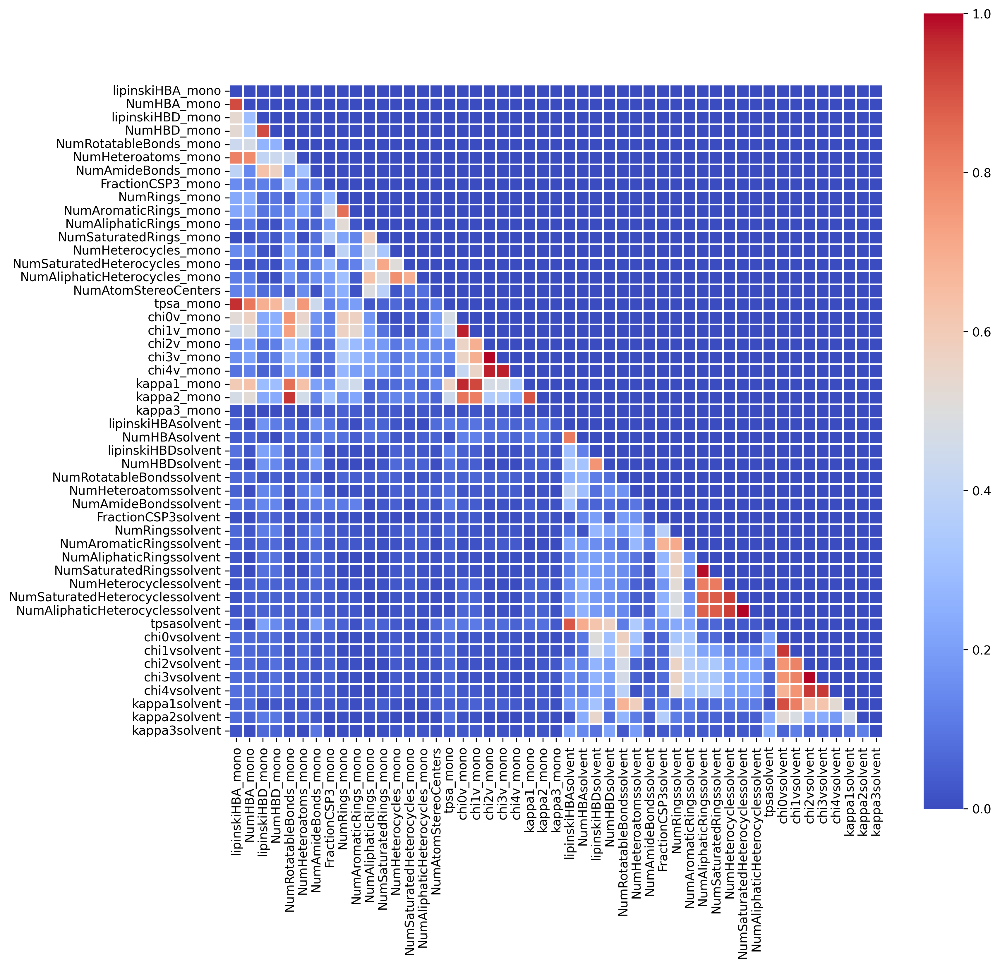

In [77]:
fig, ax = plt.subplots(figsize=(12,12), dpi=300, ncols=1, nrows=1)
sns.heatmap(utriang_mask, cmap="coolwarm", ax=ax, cbar=True,
			 square=True, linewidths=1,
			 xticklabels=True, yticklabels=True
			 )
ax.set_xticklabels(ax.get_xticklabels(), size=10)
ax.set_yticklabels(ax.get_yticklabels(), size=10)

### SHAP Analysis
- For best homopolymer classical model (RF with RDKit descriptors)

Define imports and load homopolymer DB

In [9]:
import shap
import graphviz
from sklearn import tree
import matplotlib as mpl

pkl_path = Path.cwd().parent/"data/pkls"
df_atnr_nope = pd.read_pickle(pkl_path/"df_atactic_NOPE_nr_norad.pkl") 

atnr_nope_RF_models = dff_atnr_nope[dff_atnr_nope.model_name.str.contains('Random')]
atnr_nope_RF_clf_fxns = [x for x in atnr_nope_RF_models.model_function]
clf_tmp_rdk = atnr_nope_RF_clf_fxns[0]

SHAP calculation

In [10]:
X_train_tmp = atnr_nope_mout.all_X_train[0][1]
X_test_tmp = atnr_nope_mout.all_X_test[0][1]
X_train_test_tmp = pd.concat([X_train_tmp,X_test_tmp])
y_train_tmp = atnr_nope_mout.y_train
y_test_tmp = atnr_nope_mout.y_test
y_train_test_tmp = pd.concat([y_train_tmp,y_test_tmp])

atnr_nope_atom_bd_allX = pd.concat([X_test_tmp, X_train_tmp])
shap_type = 'Tree'
loss_type = 'log_loss'
do_predict = True
if do_predict:
	if shap_type == 'Tree':
		#clf_tmp_rdk_shap = shap.TreeExplainer(clf_tmp_rdk)
		# Pure python example of TreeExplainer in pytree.py
		explainer_tree_atnr_nope = shap.TreeExplainer(model=clf_tmp_rdk,
												data=X_train_tmp,
												#feature_perturbation='tree_path_dependent',
												#model_output='predict' #
												#feature_names=list(X_train_tmp.columns),
            
            									#!NOTE The check_additivity flag is broken, so we hardcode check_additivity in the SHAP itself
												#check_additivity=False, 
												)

		shap_vals_rdkit_rf_atnr = explainer_tree_atnr_nope.shap_values(X_train_tmp)
		""" 
		INFO Note that there is a difference between a SHAP explaINER and explaNATION.
		- The explaINER is an object that stores the SHAP-algorithm results.
		 	it can return SHAP values as arrays or explaNATIONs
		- The explaNATION (shap.Explanation) appears to be a more structured container
		 	 for shap values to get/store metadata about the SHAP predictions
			 they might have other roles but it's unclear.
		- Some plots take shap value ARRAYS (.shap_values(X)) but others take 
			explaNATION objects  (beeswarm, summary, etc.) 
		- If you pass an Array of Shap Values to certain plots (incl. beeswarm),
			they will raise an exception as they are checking
			for object type explaNATION not object type ndarray. 
			For beeswarm, it doesn't seem like any explaNATION 
			specific properties are used except when clustering (which is disabled by default..).
		- explainer_instance.shap_values(X_data) --> returns ARRAY of SHAP values
		- explainer_instance(X_data) --> returns EXPLANATION OBJECT 

		explaNATION objects
		.data: stores X data
		"""
		explaNATION_object_rdkit_rf_atnr = explainer_tree_atnr_nope(X_train_tmp)
		

		test_explainer_tree_atnr_nope = shap.TreeExplainer(model=clf_tmp_rdk,
												data=X_test_tmp,
												#feature_perturbation='tree_path_dependent',
												#model_output='predict' #
												#feature_names=list(X_train_tmp.columns),
            
                        						#!NOTE The check_additivity flag is broken, so we hardcode check_additivity in the SHAP itself
												#check_additivity=False, 
												)
		test_shap_vals_rdkit_rf_atnr = explainer_tree_atnr_nope.shap_values(X_test_tmp)
		test_explaNATION_object_rdkit_rf_atnr = test_explainer_tree_atnr_nope(X_test_tmp)
	elif shap_type == 'kernel':

		explainer_kernel_atnr_nope = shap.KernelExplainer(model=clf_tmp_rdk.predict_proba,
															data = X_train_tmp,
															seed=0)
		shap_vals_rdkit_rf_atnr = explainer_kernel_atnr_nope.shap_values(X_test_tmp)
	else:
		explainer_newapi_atnr_nope = shap.Explainer(clf_tmp_rdk, 
												X_train_tmp)
		shap_vals_rdkit_rf_atnr = explainer_newapi_atnr_nope(X_test_tmp = atnr_nope_mout.all_X_test[0][1]
	)


FEATURE NAMES: 49 ['lipinskiHBA_mono', 'NumHBA_mono', 'lipinskiHBD_mono', 'NumHBD_mono', 'NumRotatableBonds_mono', 'NumHeteroatoms_mono', 'NumAmideBonds_mono', 'FractionCSP3_mono', 'NumRings_mono', 'NumAromaticRings_mono', 'NumAliphaticRings_mono', 'NumSaturatedRings_mono', 'NumHeterocycles_mono', 'NumSaturatedHeterocycles_mono', 'NumAliphaticHeterocycles_mono', 'NumAtomStereoCenters', 'tpsa_mono', 'chi0v_mono', 'chi1v_mono', 'chi2v_mono', 'chi3v_mono', 'chi4v_mono', 'kappa1_mono', 'kappa2_mono', 'kappa3_mono', 'lipinskiHBAsolvent', 'NumHBAsolvent', 'lipinskiHBDsolvent', 'NumHBDsolvent', 'NumRotatableBondssolvent', 'NumHeteroatomssolvent', 'NumAmideBondssolvent', 'FractionCSP3solvent', 'NumRingssolvent', 'NumAromaticRingssolvent', 'NumAliphaticRingssolvent', 'NumSaturatedRingssolvent', 'NumHeterocyclessolvent', 'NumSaturatedHeterocyclessolvent', 'NumAliphaticHeterocyclessolvent', 'tpsasolvent', 'chi0vsolvent', 'chi1vsolvent', 'chi2vsolvent', 'chi3vsolvent', 'chi4vsolvent', 'kappa1solve

100%|===================| 2717/2726 [01:15<00:00]        

DIFF RATIO IS  0.2820512572203815
DIFF RATIO IS  0.020846492086457922


 99%|===================| 2697/2726 [01:17<00:00]        

FEATURE NAMES: 49 ['lipinskiHBA_mono', 'NumHBA_mono', 'lipinskiHBD_mono', 'NumHBD_mono', 'NumRotatableBonds_mono', 'NumHeteroatoms_mono', 'NumAmideBonds_mono', 'FractionCSP3_mono', 'NumRings_mono', 'NumAromaticRings_mono', 'NumAliphaticRings_mono', 'NumSaturatedRings_mono', 'NumHeterocycles_mono', 'NumSaturatedHeterocycles_mono', 'NumAliphaticHeterocycles_mono', 'NumAtomStereoCenters', 'tpsa_mono', 'chi0v_mono', 'chi1v_mono', 'chi2v_mono', 'chi3v_mono', 'chi4v_mono', 'kappa1_mono', 'kappa2_mono', 'kappa3_mono', 'lipinskiHBAsolvent', 'NumHBAsolvent', 'lipinskiHBDsolvent', 'NumHBDsolvent', 'NumRotatableBondssolvent', 'NumHeteroatomssolvent', 'NumAmideBondssolvent', 'FractionCSP3solvent', 'NumRingssolvent', 'NumAromaticRingssolvent', 'NumAliphaticRingssolvent', 'NumSaturatedRingssolvent', 'NumHeterocyclessolvent', 'NumSaturatedHeterocyclessolvent', 'NumAliphaticHeterocyclessolvent', 'tpsasolvent', 'chi0vsolvent', 'chi1vsolvent', 'chi2vsolvent', 'chi3vsolvent', 'chi4vsolvent', 'kappa1solve

 96%|=================== | 874/910 [00:24<00:00]       

DIFF RATIO IS  0.21951218178471846
DIFF RATIO IS  0.021294904170439465


 96%|=================== | 872/910 [00:23<00:01]       

In [12]:
'test E(x)',test_explainer_tree_atnr_nope.expected_value
'train E(x)',explainer_tree_atnr_nope.expected_value

('train E(x)', array([0.29218333, 0.70781667]))

#### Actual SHAP Part

In [14]:
shap.initjs()
def shap_force(clf, ind, 
               X_train_df, y_train,
               explainer, shap_vals,
               pred_class: bool=1,
               use_absolute_indices: bool=True, # Set to false to use iloc (relative indices)
               use_mpl: bool=False
               ):
  
    """Takes in a fitted classifier Pipeline, the name of the classifier step,
        the X training DataFrame, the y train array, a shap explainer, and the
        shap values to print the ground truth and predicted label and display
        the shap force plot for the record specified by ind.
    Args:
        clf (estimator): An sklearn Pipeline with a fitted classifier as the final step.
        clf_step_name (str): The name given to the classifier step of the pipe.
        X_train_df (DataFrame): A Pandas DataFrame from the train-test-split
            used to train the classifier, with column names corresponding to
            the feature names.
        y_train (series or array): Subset of y data used for training.
        ind (int): The ind of the observation of interest.
        explainer (shap explainer): A fitted shap.TreeExplainer object.
        shap_vals (array): The array of shap values.
    Returns:
        Figure: Shap force plot showing the breakdown of how the model made
            its prediction for the specified record in the training set.
    """    
    
    
    ## Store model prediction and ground truth label
    #pred = clf.named_steps[clf_step_name].predict(X_train_df.iloc[ind,:])

    #* IF TRUE, USES LOC[ind, :]. ELSE, USES ILOC[ind, :].
    # Position within SHAP values/datapoints
    ind_rel = list(X_train_df.index).index(ind)
    

    if use_absolute_indices == False:
        pred_data = X_train_df.iloc[ind,:]
    else:
        pred_data = X_train_df.loc[ind,:]
    #display(pred_data)
    pred = clf.predict(pred_data.values.reshape(1, -1))
    if use_absolute_indices == False:
        true_label = y_train.iloc[ind]
        
        mono_name = df_atnr_nope.iloc[ind,:].mono_name
        mono_mol = df_atnr_nope.iloc[ind,:].mono_mol
        solv_name = df_atnr_nope.iloc[ind,:].solvent
        solv_mol = df_atnr_nope.iloc[ind,:].solvent_mol
    else:
        true_label = y_train.loc[ind]

        mono_name = df_atnr_nope.loc[ind,:].mono_name
        mono_mol = df_atnr_nope.loc[ind,:].mono_mol
        solv_name = df_atnr_nope.loc[ind,:].solvent
        solv_mol = df_atnr_nope.loc[ind,:].solvent_mol


    ## Assess accuracy of prediction
    if true_label == pred:
        accurate = 'Correct!'
    else:
        accurate = 'Incorrect'
    
    
    ## Print output that checks model's prediction against true label
    print('***'*12)
    # Print ground truth label for row at ind
    print()
    print(f"Index: {ind}")
    print(f"Mono Name: {mono_name}")
    print(f"Solv Name: {solv_name}")
    print()
    print(f'Ground Truth Label: {true_label}')
    print()
    # Print model prediction for row at ind
    print(f'Model Prediction:  {pred} -- {accurate}')
    print('***'*12)
    print()
    display(mono_mol,solv_mol)

    # Use relative index for SHAP value if using absolute indices. Else, uses same ind.
    if use_absolute_indices == False:
        shap_vals_selec = shap_vals[pred_class][ind]
    else:
        shap_vals_selec = shap_vals[pred_class][ind_rel]
    ## Plot the prediction's explanation
    fig = None
    # if mpl is True, set show to False.
    show_val = not use_mpl 
    fig = shap.force_plot(explainer.expected_value[pred_class],
                              shap_vals_selec,
                              pred_data,
                              matplotlib=use_mpl, # ADDED 10.18.23 
                              show=show_val, # ADDED 10.18.23 
                              )
    
    return fig

def shap_water(clf, ind, 
               X_train_df, y_train,
               explainer, shap_vals,
               pred_class: bool=1,
               use_mpl: bool=False
               ):
  
    """Takes in a fitted classifier Pipeline, the name of the classifier step,
        the X training DataFrame, the y train array, a shap explainer, and the
        shap values to print the ground truth and predicted label and display
        the shap force plot for the record specified by ind.
    Args:
        clf (estimator): An sklearn Pipeline with a fitted classifier as the final step.
        clf_step_name (str): The name given to the classifier step of the pipe.
        X_train_df (DataFrame): A Pandas DataFrame from the train-test-split
            used to train the classifier, with column names corresponding to
            the feature names.
        y_train (series or array): Subset of y data used for training.
        ind (int): The ind of the observation of interest.
        explainer (shap explainer): A fitted shap.TreeExplainer object.
        shap_vals (array): The array of shap values.
    Returns:
        Figure: Shap force plot showing the breakdown of how the model made
            its prediction for the specified record in the training set.
    """    
    
    
    ## Store model prediction and ground truth label
    #pred = clf.named_steps[clf_step_name].predict(X_train_df.iloc[ind,:])
    try:
        pred_data = X_train_df.iloc[ind,:]
    except IndexError:
        # If lookup fails, try loc instead
        pred_data = X_train_df.loc[ind,:]

    #display(pred_data)
    pred = clf.predict(pred_data.values.reshape(1, -1))
    try:
        true_label = y_train.iloc[ind]
    except IndexError:
        # If lookup fails, try loc instead
        true_label = y_train.loc[ind]

    
    
    mono_name = df_atnr_nope.iloc[ind,:].mono_name
    mono_mol = df_atnr_nope.iloc[ind,:].mono_mol
    solv_name = df_atnr_nope.iloc[ind,:].solvent
    solv_mol = df_atnr_nope.iloc[ind,:].solvent_mol


    ## Assess accuracy of prediction
    if true_label == pred:
        accurate = 'Correct!'
    else:
        accurate = 'Incorrect'
    
    
    ## Print output that checks model's prediction against true label
    print('***'*12)
    # Print ground truth label for row at ind
    print()
    print(f"Index: {ind}")
    print(f"Mono Name: {mono_name}")
    print(f"Solv Name: {solv_name}")
    print()
    print(f'Ground Truth Label: {true_label}')
    print()
    # Print model prediction for row at ind
    print(f'Model Prediction:  {pred} -- {accurate}')
    print('***'*12)
    print()
    display(mono_mol,solv_mol)

    ## Plot the prediction's explanation
    fig = None
    fig = shap.waterfall_plot(explainer.expected_value[pred_class],
                              shap_vals[pred_class][ind],
                              X_train_df.iloc[ind,:])
    
    return fig


def shap_multi_force(clf, ind_lower, ind_higher,
               X_data, y_data,
               explainer, shap_vals,
               pred_class: bool=1,
               use_mpl: bool=False # unused
               ):
  
    """Takes in a fitted classifier, two indices,
        the X training DataFrame, the y train array, a shap explainer, and the
        shap values to print the ground truth and predicted label and display
        the shap force plot for the record specified by ind.
        
    Args:
        clf (estimator): A  fitted classifier 
        X_data (DataFrame): A Pandas DataFrame from the train-test-split
            used to train the classifier, with column names corresponding to
            the feature names.
        y_data (series or array): Subset of y data used for training.
        ind (int): The ind of the observation of interest.
        explainer (shap explainer): A fitted shap.TreeExplainer object.
        shap_vals (array): The array of shap values.
    Returns:
        Figure: Shap force plot showing the breakdown of how the model made
            its prediction for the specified records in the training set.
    """    
    

    

    pred_data = X_data.iloc[ind_lower:ind_higher,:]
    true_labels = y_data.iloc[ind_lower:ind_higher]
    pred_labels = clf.predict(pred_data.values) 
    
    mono_names = df_atnr_nope.iloc[ind_lower:ind_higher,:].mono_name
    mono_mols = df_atnr_nope.iloc[ind_lower:ind_higher,:].mono_mol
    solv_names = df_atnr_nope.iloc[ind_lower:ind_higher,:].solvent
    solv_mols = df_atnr_nope.iloc[ind_lower:ind_higher,:].solvent_mol


    ## Assess accuracy of prediction
    accuracy = accuracy_score(y_true=true_labels, y_pred=pred_labels)

    
    ## Print output that checks model's prediction against true label
    print('***'*12)
    # Print ground truth label for row at ind
    print()
    print(f"Indices (RELATIVE): {ind_lower,ind_higher}")
    print(f"Mono Names: {mono_names}")
    print(f"Solv Names: {solv_names}")
    print()
    print(f'Ground Truth Label: {true_labels}')
    print()
    # Print model prediction for row at ind
    print(f'Model accuracy:  {accuracy:.3f}')
    print('***'*12)
    print()

    shap_vals_pred_class = pd.DataFrame(shap_vals[pred_class], columns=X_train_tmp.columns)
    shap_vals_selec = shap_vals_pred_class.iloc[ind_lower:ind_higher, :].values
    ## Plot the prediction's explanation
    fig = None
    fig = shap.force_plot(explainer.expected_value[pred_class],
                              shap_vals_selec,
                              pred_data,
                              matplotlib=use_mpl, 
                              show=True,  
                              )
    
    return fig

Define lookup function 

In [15]:

def lookup_mono_solv(mono_names, solv_names):
	sel_data = df_atnr_nope
	if solv_names == "all":
		solv_names = list(df_atnr_nope.solvent.unique())
	if isinstance(mono_names, str):
		mono_names = list(mono_names)
	selected_names = sel_data.loc[(sel_data.mono_name.isin(mono_names)) 
							   & (sel_data.solvent.isin(solv_names)), :]
	idx_in_train = list(X_train_tmp[X_train_tmp.index.isin(selected_names.index)].index)
	idx_in_test = list(X_test_tmp[X_test_tmp.index.isin(selected_names.index)].index)
	selected_names.insert(loc=8, column="test_or_train", value=None)
	for row in selected_names.itertuples():
		if row.Index in idx_in_train:
			selected_names.at[row.Index,"test_or_train"] = "train"
		if row.Index in idx_in_test:
			selected_names.at[row.Index,"test_or_train"] = "test"
	return selected_names

In [16]:
expt_poly_names = ["propylene", "styrene", "lactic acid", "methyl methacrylate", "acrylic acid"]
expt_solv_names = ["cyclohexane", "dichloromethane", "tetrahydrofuran", "toluene"]
lookup_mono_solv(expt_poly_names,
				expt_solv_names)

,polymer,mono_name,mono_smiles,mono_mol,solvent,solvent_smiles,solvent_mol,solvent_characteristic,test_or_train
429,Poly(styrene) atactic,styrene,C=Cc1ccccc1,<rdkit.Chem.rdchem.Mol object at 0x00000217DC7...,tetrahydrofuran,C1CCOC1,<rdkit.Chem.rdchem.Mol object at 0x00000217DC7...,1,train
432,Poly(styrene),styrene,C=Cc1ccccc1,<rdkit.Chem.rdchem.Mol object at 0x00000217DC7...,toluene,Cc1ccccc1,<rdkit.Chem.rdchem.Mol object at 0x00000217DC7...,1,train
733,Poly(methyl methacrylate),methyl methacrylate,C=C(C)C(=O)OC,<rdkit.Chem.rdchem.Mol object at 0x00000217DC7...,tetrahydrofuran,C1CCOC1,<rdkit.Chem.rdchem.Mol object at 0x00000217DD8...,1,test


Find SHAP values for selected single SHAP example (soluble, idx 432, Train, styrene-toluene)

In [17]:
insol_vals = pd.DataFrame(shap_vals_rdkit_rf_atnr[0], columns=X_train_tmp.columns,
						 index=X_train_tmp.index) #! Added 10.22.23, important or indices will be wrong!
sol_vals = pd.DataFrame(shap_vals_rdkit_rf_atnr[1], columns=X_train_tmp.columns,
						 index=X_train_tmp.index) #! Added 10.22.23, important or indices will be wrong!
idx_432 = pd.concat([insol_vals.loc[432,:], sol_vals.loc[432,:], X_train_tmp.loc[432,:]], axis=1,)
idx_432.columns = ["shap_vals_insol", "shap_vals_sol", "descriptor_val"]

Find SHAP values for selected single SHAP example (insoluble, idx 810, Train)

In [18]:
idx_810 = pd.concat([insol_vals.loc[810,:], sol_vals.loc[810,:], X_train_tmp.loc[810,:]], axis=1,)
idx_810.columns = ["shap_vals_insol", "shap_vals_sol", "descriptor_val"]

In [19]:
from matplotlib import rcParams
mpl.rcParams['figure.titlesize'] = 16
mpl.rcParams['figure.titleweight'] = 'bold'
#mpl.rcParams['font.family'] = 'sans-serif'
#mpl.rcParams['font.size'] = 14

#mpl.rcParams['lines.linewidth] = 3'
#mpl.rcParams['lines.markersize'] = 10
#mpl.rcParams['xtick.labelsize'] = 14
#mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['axes.labelweight'] = 'bold'
mpl.rcParams['svg.fonttype'] = 'none'


Plot single SHAP (soluble)

************************************

Index: 432
Mono Name: styrene
Solv Name: toluene

Ground Truth Label: 1

Model Prediction:  [1] -- Correct!
************************************



X does not have valid feature names, but RandomForestClassifier was fitted with feature names


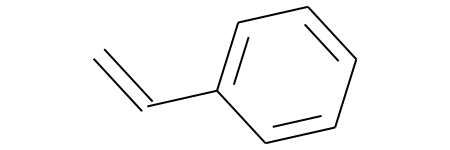

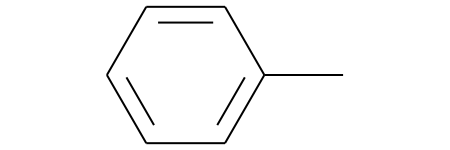

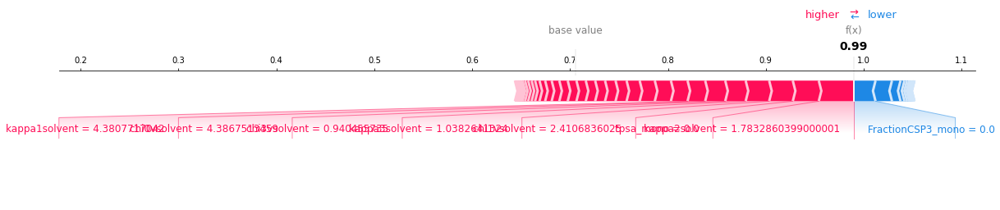

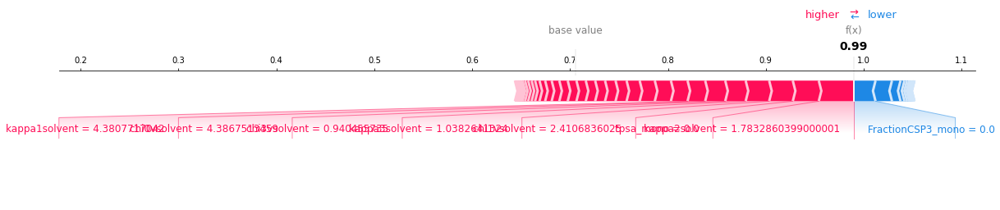

In [24]:
inds = [470, 777, 1280]
e_caprolactam_inds = [x for x in range(1358,1369)]
use_abs_inds = True

usempl = True
if usempl:
  plt.rcParams["svg.fonttype"] = 'none'
fig_out = shap_force(clf_tmp_rdk, 
          432, 
          X_train_tmp, 
          atnr_nope_mout.y_train, 
          explainer_tree_atnr_nope,
            shap_vals_rdkit_rf_atnr,
            pred_class=1,
            use_absolute_indices=use_abs_inds,
            use_mpl=usempl)
fig_out

Lookup insoluble example from train

In [25]:
unique_mono_traintest = (df_atnr_nope.sort_values(by=["mono_smiles"])
 			.loc[(df_atnr_nope.solvent_characteristic == 0),["mono_name","mono_smiles"]]
			.mono_name
			.unique()
			)

In [26]:
lookup_mono_solv(["n-lauryl methacrylate"],"all")

,polymer,mono_name,mono_smiles,mono_mol,solvent,solvent_smiles,solvent_mol,solvent_characteristic,test_or_train
808,Poly(n-lauryl methacrylate),n-lauryl methacrylate,C=C(C)C(=O)OCCCCCCCCCCCC,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,methanol,CO,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,0,train
809,Poly(n-lauryl methacrylate),n-lauryl methacrylate,C=C(C)C(=O)OCCCCCCCCCCCC,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,methyl ethyl ketone,CCC(C)=O,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,1,train
810,Poly(n-lauryl methacrylate),n-lauryl methacrylate,C=C(C)C(=O)OCCCCCCCCCCCC,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,ethyl acetate,CCOC(C)=O,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,0,train
811,Poly(n-lauryl methacrylate),n-lauryl methacrylate,C=C(C)C(=O)OCCCCCCCCCCCC,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,isopropyl acetate,CC(=O)OC(C)C,<rdkit.Chem.rdchem.Mol object at 0x000002625A7...,1,train


Plot single SHAP force (insoluble)

************************************

Index: 810
Mono Name: n-lauryl methacrylate
Solv Name: ethyl acetate

Ground Truth Label: 0

Model Prediction:  [0] -- Correct!
************************************



X does not have valid feature names, but RandomForestClassifier was fitted with feature names


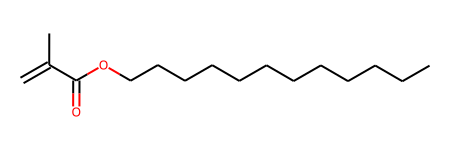

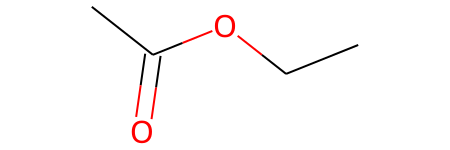

In [27]:

usempl = False
if usempl:
  plt.rcParams["svg.fonttype"] = 'none'
fig_out_singleshap_insol = shap_force(clf_tmp_rdk, 
          810, 
          X_train_tmp, 
          atnr_nope_mout.y_train, 
          explainer_tree_atnr_nope,
            shap_vals_rdkit_rf_atnr,
            pred_class=1,
            use_absolute_indices=True,
            use_mpl=usempl)
fig_out_singleshap_insol

multi vals

In [33]:
from copy import deepcopy
def prep_explanation_for_plot(explainer_obj, pred_class:int = 1):
	""" Takes an explainer object and optionally the class for 
	which to predict and returns a new object with only that class
	"""
	new_exp_obj = deepcopy(explainer_obj)
	print("BEFORE ",new_exp_obj.shape) #= #len(new_exp_obj.values.shape)
	new_exp_obj.values = explainer_obj.values[:,:,pred_class]
	print("AFTER ",new_exp_obj.shape) #= #len(new_exp_obj.values.shape)
	return new_exp_obj

plt_explaNATION_object_rdkit_rf_atnr = prep_explanation_for_plot(explaNATION_object_rdkit_rf_atnr)
plt_test_explaNATION_object_rdkit_rf_atnr = prep_explanation_for_plot(test_explaNATION_object_rdkit_rf_atnr)

BEFORE  (1363, 49, 2)
AFTER  (1363, 49)
BEFORE  (455, 49, 2)
AFTER  (455, 49)


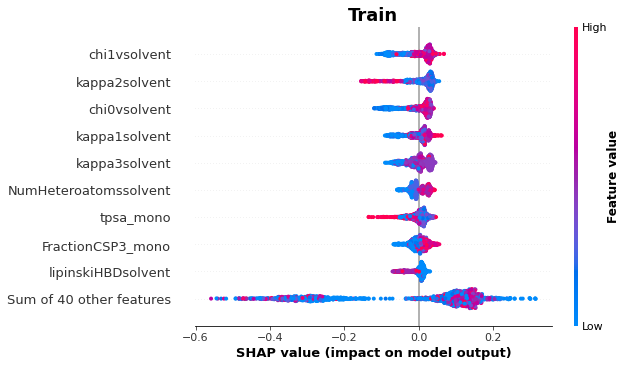

In [34]:
from matplotlib.gridspec import GridSpec
#fig1 = shap.plots.beeswarm(shap.Explanation(shap_vals_rdkit_rf_atnr[1]))
#fig1 = shap.plots.beeswarm(shap.Explanation(shap_vals_rdkit_rf_atnr[1]))
fig_swarm_train = shap.plots.beeswarm(plt_explaNATION_object_rdkit_rf_atnr, show=False)
ax_train = fig_swarm_train.gca()
ax_train.set_title("Train", weight='bold', fontsize=18)
fig_swarm_train.savefig(shap_fig_dir/"beeswarm_SHAP_rdkit_RF_atnr_NOPE_train_RAW.svg", format="svg", dpi=600)


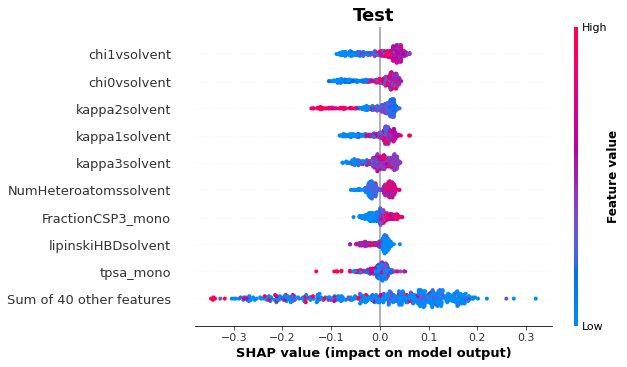

In [35]:


fig_swarm_test = shap.plots.beeswarm(plt_test_explaNATION_object_rdkit_rf_atnr, show=False)
ax_test = fig_swarm_test.gca()
ax_test.set_title("Test", weight='bold', fontsize=18)

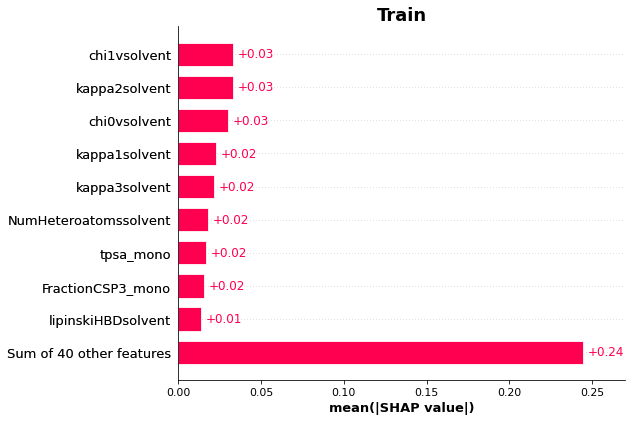

In [50]:
fig_bar_train = shap.plots.bar(plt_explaNATION_object_rdkit_rf_atnr, max_display=10, show=False)
ax_bar_train = fig_bar_train.gca()
ax_bar_train.set_title("Train", weight='bold', fontsize=18)
fig_bar_train.savefig(shap_fig_dir/"bar_SHAP_rdkit_RF_atnr_NOPE_train_top10_RAW.svg", format="svg", dpi=600)

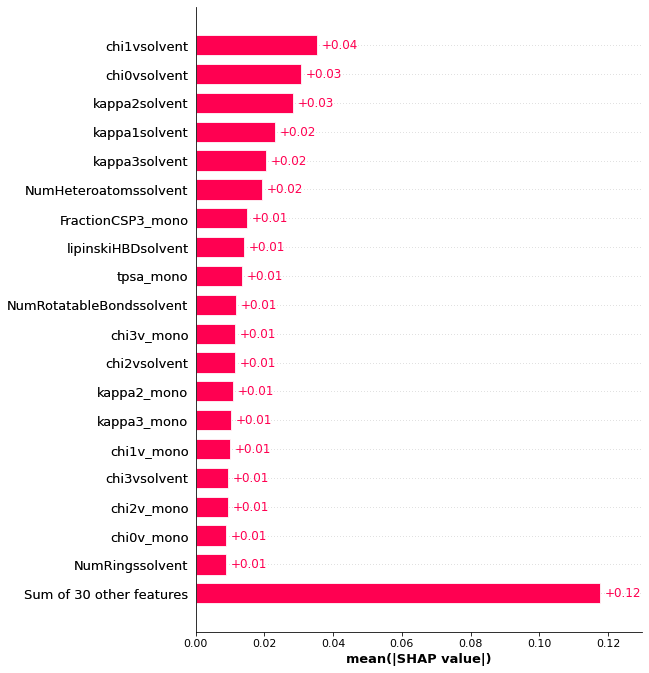

In [48]:
fig_bar_test = shap.plots.bar(plt_test_explaNATION_object_rdkit_rf_atnr, max_display=20, show=False)
ax_bar_test = fig_bar_train.gca()
ax_bar_test.set_title("Test", weight='bold', fontsize=18)
fig_bar_test.savefig(shap_fig_dir/"bar_SHAP_rdkit_RF_atnr_NOPE_test_top20_RAW.svg", format="svg", dpi=600)

In [100]:
ind_low_train = 500
ind_high_train = 1000
fig_out_train = shap_multi_force(
          clf=clf_tmp_rdk, 
          ind_lower=ind_low_train,
          ind_higher=ind_high_train, 
          X_data=X_train_tmp, 
          y_data=atnr_nope_mout.y_train, 
          explainer=explainer_tree_atnr_nope,
          shap_vals=shap_vals_rdkit_rf_atnr,
          pred_class=1,
          use_mpl=False)
fig_out_train

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


************************************

Indices (RELATIVE): (500, 1000)
Mono Names: 500          cyclohexylethylene
501          cyclohexylethylene
502          cyclohexylethylene
503          cyclohexylethylene
504          cyclohexylethylene
                 ...           
995          n-hexyl isocyanate
996          n-hexyl isocyanate
997       dihexyloxyphosphazene
998    n-pentyl-n-hexylsilylene
999          di-n-hexylsilylene
Name: mono_name, Length: 500, dtype: object
Solv Names: 500                  heptane
501                  dioxane
502                 alcohols
503    tetrahydronaphthalene
504          tetrahydrofuran
               ...          
995                 methanol
996                  benzene
997                  benzene
998                  toluene
999                isooctane
Name: solvent, Length: 500, dtype: object

Ground Truth Label: 805     1
1796    1
384     1
200     1
1713    1
       ..
832     0
951     1
1144    0
1338    1
1037    0
Name: solvent_char

In [93]:
from shap.plots._force import save_html# as force_plot, initjs, save_html, getjs

In [95]:
shap.save_html(out_file=str(shap_fig_dir/f"SHAP_force_multi_at_NOPE_nr_RF_RDKit_train_ind{ind_low}to{ind_high}.html"),
		  plot=fig_out_train)

Multi force - test set

In [101]:
ind_low_test = 0
ind_high_test = 455
fig_out_test = shap_multi_force(
          clf=clf_tmp_rdk, 
          ind_lower=ind_low_test,
          ind_higher=ind_high_test, 
          X_data=X_test_tmp, 
          y_data=atnr_nope_mout.y_test, 
          explainer=test_explainer_tree_atnr_nope,
          shap_vals=test_shap_vals_rdkit_rf_atnr,
          pred_class=1,
          use_mpl=False)
fig_out_test

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


************************************

Indices (RELATIVE): (0, 455)
Mono Names: 0            acetylene
1            acetylene
2            acetylene
3            acetylene
4            acetylene
            ...       
450            styrene
451     2-bromostyrene
452     2-bromostyrene
453    2-chlorostyrene
454    2-chlorostyrene
Name: mono_name, Length: 455, dtype: object
Solv Names: 0                   aniline
1                   acetone
2                   Benzene
3      carbon tetrachloride
4               cyclohexane
               ...         
450     tricresyl phosphate
451         tetrahydrofuran
452                 benzene
453                 toluene
454     methyl ethyl ketone
Name: solvent, Length: 455, dtype: object

Ground Truth Label: 1248    1
713     0
217     0
1408    1
1740    1
       ..
530     1
642     0
1751    0
1784    0
210     1
Name: solvent_characteristic, Length: 455, dtype: int64

Model accuracy:  0.846
************************************



Plot distribution of RDKit Features for at_NOPE_nr

Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.


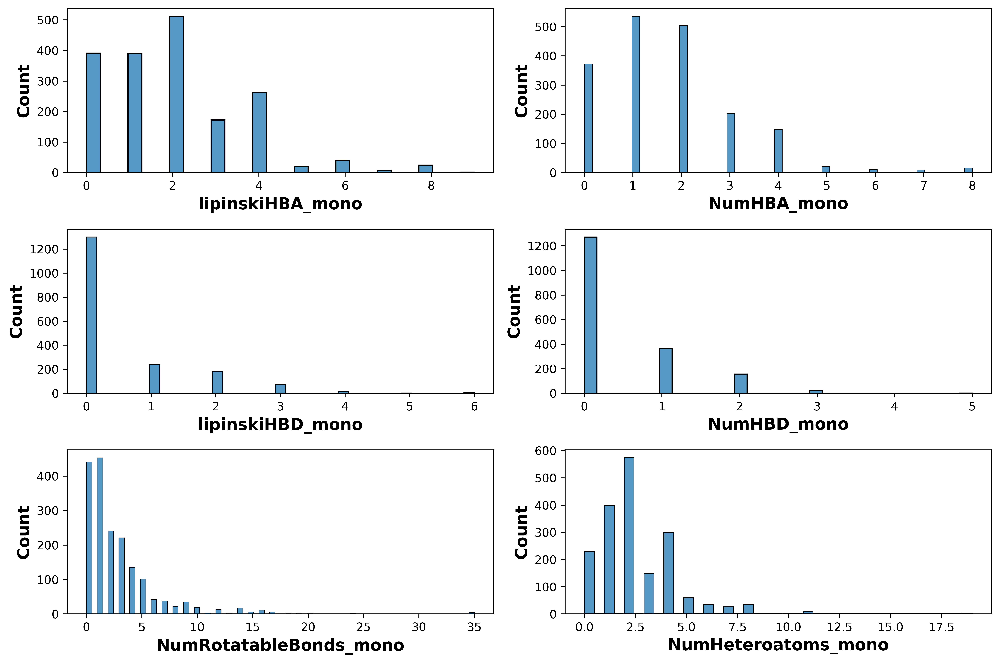

In [90]:
numfeats = 6
numcols = 2
numrows = 3
numaxs = numcols*numrows
feat_of_interest = "NumHBDsolvent"
data_subset = "all"

if data_subset == "train":
	sel_data = X_train_tmp
elif data_subset == "test":
	sel_data = X_test_tmp
elif data_subset == "all":
	sel_data = X_train_test_tmp

	
fig, axs = plt.subplots(nrows=numrows, ncols=numcols, figsize=(12,8), dpi=600)
#axs_number_cols = axs.shape[1]
row_ind,col_ind = np.unravel_index(range(numfeats), axs.shape)
for i in range(numfeats):
	#* ALTERNATIVE: use np.unravel_index
	curr_ax = axs[row_ind[i]][col_ind[i]]
	#print(row_ind[i],col_ind[i])

	colname = list(sel_data.columns)[i]
	sns.histplot(ax=curr_ax, data=sel_data, x=colname, 
				#hue=feat_of_interest,
			   	multiple="stack",
			  	palette="plasma")
plt.tight_layout()

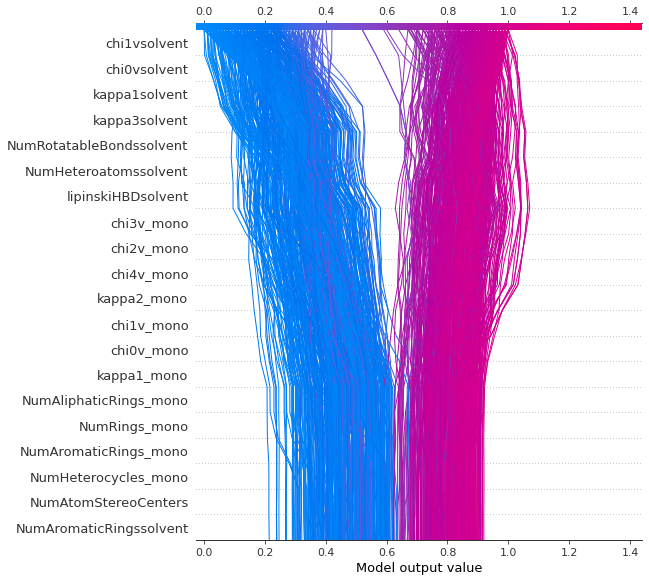

In [29]:
train_features_display = X_train_tmp #.iloc[features.index]
#shap.plots.scatter(test_shap_vals_rdkit_rf_atnr[:, "Latitude"], color=shap_values)
shap.decision_plot(explainer_tree_atnr_nope.expected_value[1], 
				   shap_vals_rdkit_rf_atnr[1],
				    train_features_display,
					#link='logit',
					feature_order='hclust', 
					)